## Environment request

In [1]:
#!pip install tensorflow-gpu==2.0.0

In [2]:
#!pip uninstall -y tensorflow

In [3]:
# !pip install pydot-ng 
# !pip install graphviz 
# !pip install pydot==1.2.3

## Select GPU for training 

In [4]:
import tensorflow as tf
print(tf.__version__)
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))

2.0.0
Num GPUs Available:  2


In [5]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
    try:
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)

2 Physical GPUs, 1 Logical GPU


## Import request package

In [6]:
import os
import cv2
import glob
import shutil
import random

import numpy as np
import matplotlib.pyplot as plt

from model import *
from data import *
from tqdm import tqdm
from datetime import datetime



import tensorflow as tf
tf.__version__

Using TensorFlow backend.


'2.0.0'

## K-fold-learning hyperparameter

In [7]:
k = 6
#K-fold default

train_image_folder = '/home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/dataset/train_roots/image'
train_label_folder = '/home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/dataset/train_roots/label'
k_fold_data_save_path = '/home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/dataset/train_roots'
k_fold_folder_name = 'k_fold_learning'
#load data and split K group

model_save_path = '/home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/'
model_save_name = 'roots_background_bi_unet_k-fold-learning'
model_save_tpye = '.hdf5'
# model will be save in 'model_save_path+model_save_name_{K}+model_save_tpye


## K-fold folder build

In [8]:
# if show create finish!! can keep going next step
if not os.path.isdir(os.path.join(k_fold_data_save_path, k_fold_folder_name)):
    try:
        k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
        os.makedirs(k_fold_folder_path)
        for i in range(k):
            os.makedirs(os.path.join(k_fold_folder_path,'group{}'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/image'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/label'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/aug'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/skip_data'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/skip_data/image'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/skip_data/label'.format(i+1)))
            os.makedirs(os.path.join(k_fold_folder_path,'group{}/skip_data/prediction'.format(i+1)))
        print('{} create finish!!'.format(k_fold_folder_name))
    except:
        print('{} build error'.format(k_fold_folder_name))
else:
    print('{} already exist'.format(k_fold_folder_name))

k_fold_learning create finish!!


## Assign data in k group

In [9]:
traing_image_list = glob.glob(train_image_folder+'/*.PNG')
#traing_image_list.sort()
random.shuffle (traing_image_list)

total_data_len = len(traing_image_list)
batch_num = total_data_len/k

for index,img_path in enumerate(tqdm(traing_image_list, total = total_data_len)):
    #data in other group 
    group_list = [i+1 for i in range(k)]
    group_list.pop(int(index/batch_num))
    for group in group_list:
        img_dst = os.path.join(k_fold_folder_path,'group{}/image'.format(group))
        shutil.copy2(img_path,img_dst)
        label_path = img_path.replace(train_image_folder,train_label_folder)
        label_dst = img_dst.replace('image','label')
        shutil.copy2(label_path,label_dst)
    
    
    #put data in skip_data path 
    skip_img_dst = os.path.join(k_fold_folder_path,'group{}/skip_data/image'.format(int(index/batch_num)+1))
    shutil.copy2(img_path,skip_img_dst)
    skip_label_path = img_path.replace(train_image_folder,train_label_folder)
    skip_label_dst = skip_img_dst.replace('image','label')
    shutil.copy2(skip_label_path,skip_label_dst)
print('Data in {} groups'.format(k))

100%|██████████| 114/114 [00:00<00:00, 529.17it/s]

Data in 6 groups


## Data augmentation in k group

In [10]:
def Data_augmentation(train_parent_folder,aug_path):
    data_gen_args = dict(rotation_range=0.2,
                        width_shift_range=0.05,
                        height_shift_range=0.05,
                        shear_range=0.05,
                        zoom_range=0.05,
                        horizontal_flip=True,
                        fill_mode='nearest')
    myGenerator = trainGenerator(20,train_parent_folder,'image','label',data_gen_args,save_to_dir = aug_path)
    
    num_batch = 3
    for i,batch in enumerate(myGenerator):
        if(i >= num_batch):
            break
    #image_arr,mask_arr = geneTrainNpy(aug_path,aug_path)

In [11]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
group_list = os.listdir(k_fold_folder_path)
group_list.sort()

for group_name in tqdm(group_list, total = len(group_list)):
    print('This is {}'.format(group_name))
    group_path = os.path.join(k_fold_folder_path, group_name)
    aug_path = os.path.join(group_path, 'aug')
    Data_augmentation(group_path, aug_path)

  0%|          | 0/6 [00:00<?, ?it/s]

This is group1
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.


 17%|█▋        | 1/6 [00:02<00:10,  2.10s/it]

This is group2
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.


 33%|███▎      | 2/6 [00:04<00:08,  2.13s/it]

This is group3
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.


 50%|█████     | 3/6 [00:06<00:06,  2.12s/it]

This is group4
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.


 67%|██████▋   | 4/6 [00:08<00:04,  2.11s/it]

This is group5
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.


 83%|████████▎ | 5/6 [00:10<00:02,  2.10s/it]

This is group6
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.


100%|██████████| 6/6 [00:12<00:00,  2.11s/it]


# Train Unet with training data 

In [12]:
def train_in_traindata_unet(train_parent_folder,model_save_path, model_checkpoint):
    data_gen_args = dict(rotation_range=0.2,
                        width_shift_range=0.05,
                        height_shift_range=0.05,
                        shear_range=0.05,
                        zoom_range=0.05,
                        horizontal_flip=True,
                        fill_mode='nearest')
    myGene = trainGenerator(3,train_parent_folder,'image','label',data_gen_args,save_to_dir = None)
    model = unet()
    model.fit_generator(myGene,steps_per_epoch=2000,epochs=5,callbacks=[model_checkpoint])
    return model

In [13]:
# model.summary()

# Train Unet with augmentation data

In [14]:
def train_in_augdata_unet(model, aug_path, model_save_path, model_checkpoint):    
    imgs_train,imgs_mask_train = geneTrainNpy(aug_path, aug_path)
    model.fit(imgs_train, imgs_mask_train, batch_size=2, nb_epoch=5, verbose=1,validation_split=0.2, shuffle=True, callbacks=[model_checkpoint])
    model.save(model_save_path)

In [15]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
group_list = os.listdir(k_fold_folder_path)
group_list.sort()

for group_name in tqdm(group_list, total = len(group_list)):
    print('Model start training in {}'.format(group_name))
    group_path = os.path.join(k_fold_folder_path, group_name)
    aug_path = os.path.join(group_path, 'aug')
    model_save_total_path = model_save_path+model_save_name+'_{}'.format(group_name)+model_save_tpye
    model_checkpoint = ModelCheckpoint(model_save_total_path, monitor='loss',verbose=1, save_best_only=True)
    model = train_in_traindata_unet(group_path, model_save_total_path, model_checkpoint)
    train_in_augdata_unet(model, aug_path, model_save_total_path, model_checkpoint)

  0%|          | 0/6 [00:00<?, ?it/s]

Model start training in group1


/home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/unet/model.py:56: UserWarning: Update your `Model` call to the Keras 2 API: `Model(inputs=Tensor("in..., outputs=Tensor("co...)`
  model = Model(input = inputs, output = conv10)


Epoch 1/5
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.
2000/2000 [==============================] - 165s 82ms/step - loss: 0.2292 - accuracy: 0.9006

Epoch 00001: loss improved from inf to 0.22901, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group1.hdf5
Epoch 2/5
2000/2000 [==============================] - 157s 79ms/step - loss: 0.0892 - accuracy: 0.9618

Epoch 00002: loss improved from 0.22901 to 0.08923, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group1.hdf5
Epoch 3/5
2000/2000 [==============================] - 157s 79ms/step - loss: 0.0593 - accuracy: 0.9743

Epoch 00003: loss improved from 0.08923 to 0.05928, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fo

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: UserWarning: The `nb_epoch` argument in `fit` has been renamed `epochs`.
  This is separate from the ipykernel package so we can avoid doing imports until


64/64 [==============================] - 2s 34ms/step - loss: 0.0303 - accuracy: 0.9872 - val_loss: 0.0523 - val_accuracy: 0.9833

Epoch 00001: loss improved from 0.03398 to 0.03029, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group1.hdf5
Epoch 2/5
64/64 [==============================] - 2s 32ms/step - loss: 0.0294 - accuracy: 0.9875 - val_loss: 0.0603 - val_accuracy: 0.9821

Epoch 00002: loss improved from 0.03029 to 0.02945, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group1.hdf5
Epoch 3/5
64/64 [==============================] - 2s 33ms/step - loss: 0.0269 - accuracy: 0.9886 - val_loss: 0.0509 - val_accuracy: 0.9825

Epoch 00003: loss improved from 0.02945 to 0.02692, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_b

 17%|█▋        | 1/6 [13:38<1:08:11, 818.31s/it]

Model start training in group2
Epoch 1/5
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.
2000/2000 [==============================] - 159s 80ms/step - loss: 0.2397 - accuracy: 0.8995

Epoch 00001: loss improved from inf to 0.23965, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group2.hdf5
Epoch 2/5
2000/2000 [==============================] - 157s 79ms/step - loss: 0.0861 - accuracy: 0.9630

Epoch 00002: loss improved from 0.23965 to 0.08604, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group2.hdf5
Epoch 3/5
2000/2000 [==============================] - 159s 79ms/step - loss: 0.0591 - accuracy: 0.9745

Epoch 00003: loss improved from 0.08604 to 0.05914, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fol

 33%|███▎      | 2/6 [27:06<54:21, 815.27s/it]  

Model start training in group3
Epoch 1/5
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.
2000/2000 [==============================] - 159s 80ms/step - loss: 0.2891 - accuracy: 0.8943

Epoch 00001: loss improved from inf to 0.28913, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group3.hdf5
Epoch 2/5
2000/2000 [==============================] - 157s 79ms/step - loss: 0.1955 - accuracy: 0.9524

Epoch 00002: loss improved from 0.28913 to 0.19544, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group3.hdf5
Epoch 3/5
2000/2000 [==============================] - 158s 79ms/step - loss: 0.1562 - accuracy: 0.9688

Epoch 00003: loss improved from 0.19544 to 0.15626, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fol

 50%|█████     | 3/6 [40:37<40:41, 813.98s/it]

Model start training in group4
Epoch 1/5
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.
2000/2000 [==============================] - 158s 79ms/step - loss: 0.2984 - accuracy: 0.8864

Epoch 00001: loss improved from inf to 0.29856, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group4.hdf5
Epoch 2/5
2000/2000 [==============================] - 157s 78ms/step - loss: 0.1974 - accuracy: 0.9516

Epoch 00002: loss improved from 0.29856 to 0.19744, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group4.hdf5
Epoch 3/5
2000/2000 [==============================] - 157s 78ms/step - loss: 0.1626 - accuracy: 0.9659

Epoch 00003: loss improved from 0.19744 to 0.16267, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fol

 67%|██████▋   | 4/6 [54:05<27:04, 812.06s/it]

Model start training in group5
Epoch 1/5
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.
2000/2000 [==============================] - 159s 79ms/step - loss: 0.2237 - accuracy: 0.9030

Epoch 00001: loss improved from inf to 0.22373, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group5.hdf5
Epoch 2/5
2000/2000 [==============================] - 157s 79ms/step - loss: 0.0903 - accuracy: 0.9615

Epoch 00002: loss improved from 0.22373 to 0.09035, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group5.hdf5
Epoch 3/5
2000/2000 [==============================] - 157s 78ms/step - loss: 0.0609 - accuracy: 0.9737

Epoch 00003: loss improved from 0.09035 to 0.06087, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fol

 83%|████████▎ | 5/6 [1:07:33<13:30, 810.83s/it]

Model start training in group6
Epoch 1/5
Found 95 images belonging to 1 classes.
Found 95 images belonging to 1 classes.
2000/2000 [==============================] - 158s 79ms/step - loss: 0.2238 - accuracy: 0.9004

Epoch 00001: loss improved from inf to 0.22382, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group6.hdf5
Epoch 2/5
2000/2000 [==============================] - 157s 78ms/step - loss: 0.0861 - accuracy: 0.9632

Epoch 00002: loss improved from 0.22382 to 0.08615, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fold/roots_background_bi_unet_k-fold-learning_group6.hdf5
Epoch 3/5
2000/2000 [==============================] - 157s 78ms/step - loss: 0.0579 - accuracy: 0.9750

Epoch 00003: loss improved from 0.08615 to 0.05781, saving model to /home/jingping/aiforge/tooth_xray_segmention_for_test/unet_base/model/model_weight/k-fol

100%|██████████| 6/6 [1:20:57<00:00, 809.50s/it]


### test your model and save predicted results

In [16]:
from model import *
from data import *
from datetime import datetime
from tqdm import tqdm

import os
import tensorflow as tf
tf.__version__

'2.0.0'

In [17]:
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
  # Restrict TensorFlow to only use the first GPU
    try:
        tf.config.experimental.set_visible_devices(gpus[0], 'GPU')
        logical_gpus = tf.config.experimental.list_logical_devices('GPU')
        print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPU")
    except RuntimeError as e:
        # Visible devices must be set before GPUs have been initialized
        print(e)

2 Physical GPUs, 1 Logical GPU


In [18]:
def ensemble_bin(img, model_list, flip_ = False):
    ensemble_final_result = np.zeros((img.shape[0], img.shape[1],1), dtype = 'float32')
    for index, model in enumerate(model_list):
        pr_img = model.predict(img)
        sqpr_img = np.squeeze(pr_img)
        ensemble_img = sqpr_img.copy()
        if flip_:
            imgp = np.squeeze(img)
            h_flip = cv2.flip(imgp, 1)
            h_flip = np.expand_dims(h_flip, axis=(0,3))
            pre_h_flip = model.predict(h_flip)
            pre_h_flip = np.squeeze(pre_h_flip)
            h_flip = cv2.flip(pre_h_flip, 1)

            v_flip = cv2.flip(imgp, 0)
            v_flip = np.expand_dims(v_flip, axis=(0,3))
            pre_v_flip = model.predict(v_flip)
            pre_v_flip = np.squeeze(pre_v_flip)
            v_flip = cv2.flip(pre_v_flip, 0)

            hv_flip = cv2.flip(imgp, -1)
            hv_flip = np.expand_dims(hv_flip, axis=(0,3))
            pre_hv_flip = model.predict(hv_flip)
            pre_hv_flip = np.squeeze(pre_hv_flip)
            hv_flip = cv2.flip(pre_hv_flip, -1)
            ensemble_img = (sqpr_img+h_flip+v_flip+hv_flip)/4
        ensemble_final_result = ensemble_final_result+ensemble_img
    ensemble_final_result = ensemble_final_result/(index+1)
    return np.expand_dims(np.where(ensemble_final_result > 0.5, 255, 0), axis=(0,3))

In [19]:
import os 
import shutil

import skimage.io as io
import skimage.transform as trans

from tqdm import tqdm

def test_k_group_in_skip_data(test_folder, result_folder, model_save_path):
    model = unet()
    model.load_weights(model_save_path)
    model_list = [model]
    model_fit_img_size = (256,256)
    test_img_path_list = glob.glob(test_folder+'/*.PNG')
    for img_path in tqdm(test_img_path_list, total = len(test_img_path_list)):
        img = io.imread(img_path,as_gray = True)
        targe_size = img.shape
        img = trans.resize(img,model_fit_img_size)
        img = np.expand_dims(img, axis=(0,3))
        img_esemble = ensemble_bin(img,model_list,flip_ = False)
        img_esemble = np.squeeze(img_esemble)
        cv2.imwrite(result_folder+'/{}'.format(img_path.split('/')[-1]),img_esemble)

In [20]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
group_list = os.listdir(k_fold_folder_path)
group_list.sort()

for group_name in tqdm(group_list, total = len(group_list)):
    test_folder = os.path.join(k_fold_folder_path, group_name, 'skip_data', 'image')
    result_folder = os.path.join(k_fold_folder_path, group_name, 'skip_data', 'prediction')
    model_save_total_path = model_save_path+model_save_name+'_{}'.format(group_name)+model_save_tpye
    test_k_group_in_skip_data(test_folder, result_folder, model_save_total_path)

100%|██████████| 6/6 [00:05<00:00,  1.01it/s]


In [21]:
# !conda install -y graphviz

In [22]:
#show testing result
import os
import cv2
import skimage.io as io
import skimage.transform as trans
import matplotlib.pyplot as plt


def show_k_fold_result(test_img_path_list):
    for img_path in tqdm(test_img_path_list, total = len(test_img_path_list)):
        img = cv2.imread(img_path,0)
        predict_img = cv2.imread(img_path.replace('image','prediction'),0)
        human_label = cv2.imread(img_path.replace('image','label'),0)
        plt.figure(figsize = (20,20))
        plt.subplot(131)
        plt.title('original_test_img')
        plt.imshow(img, cmap='gray')
        plt.subplot(132)
        plt.title('predict_test_img')
        plt.imshow(predict_img, cmap='gray')
        plt.subplot(133)
        plt.title('human_label')
        plt.imshow(human_label, cmap='gray')
        plt.show()

  0%|          | 0/19 [00:00<?, ?it/s]

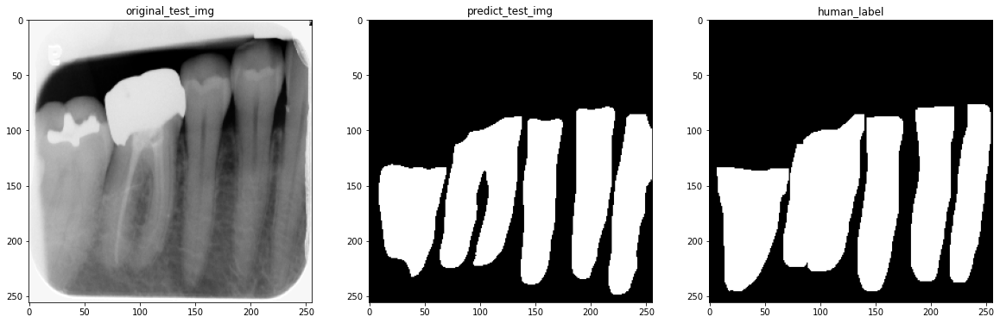


  5%|▌         | 1/19 [00:00<00:08,  2.19it/s]

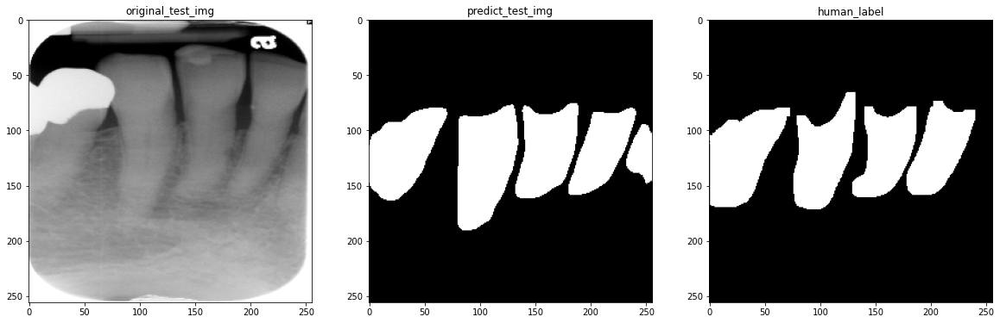


 11%|█         | 2/19 [00:00<00:07,  2.23it/s]

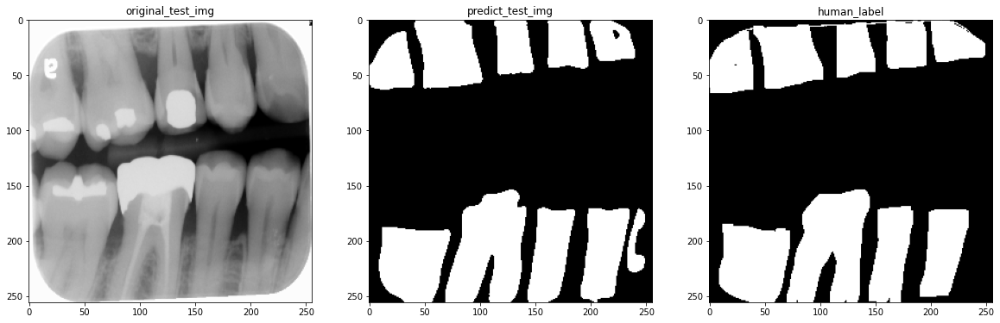


 16%|█▌        | 3/19 [00:01<00:07,  2.25it/s]

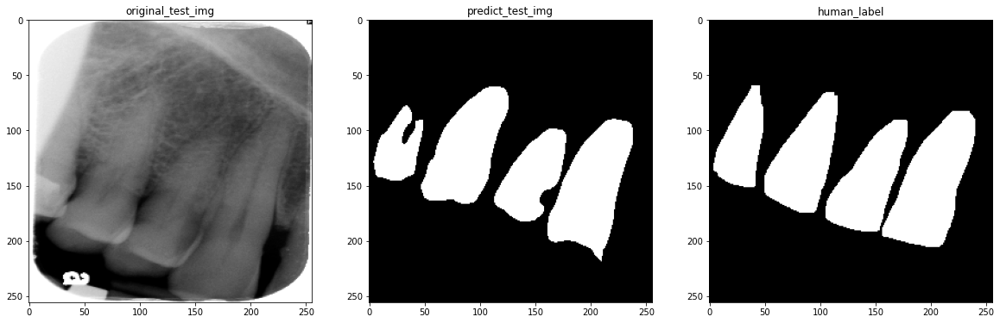


 21%|██        | 4/19 [00:01<00:06,  2.27it/s]

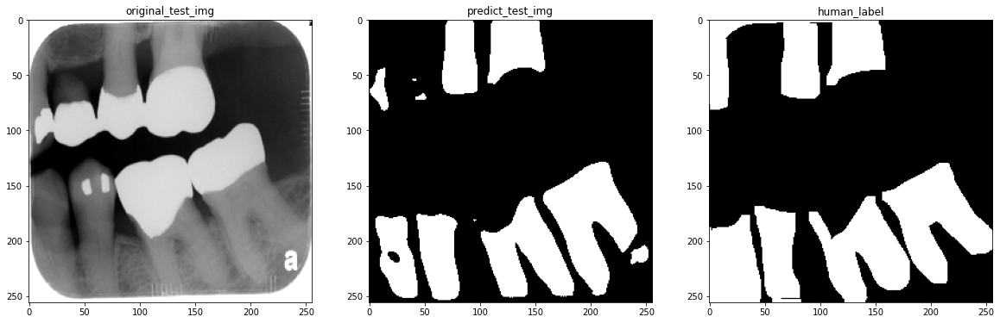


 26%|██▋       | 5/19 [00:02<00:06,  2.28it/s]

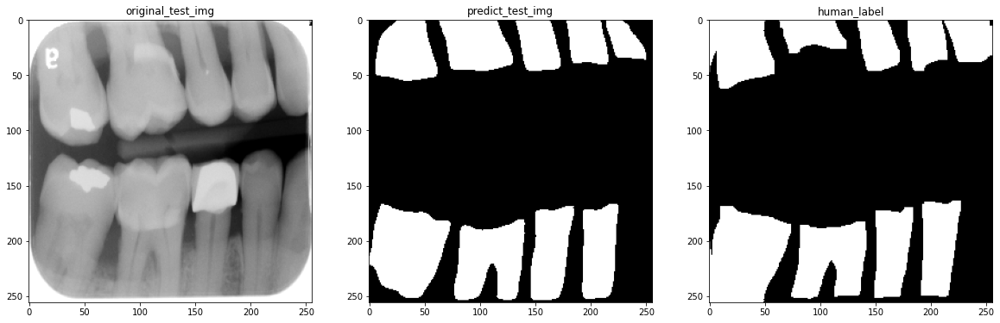


 32%|███▏      | 6/19 [00:02<00:05,  2.29it/s]

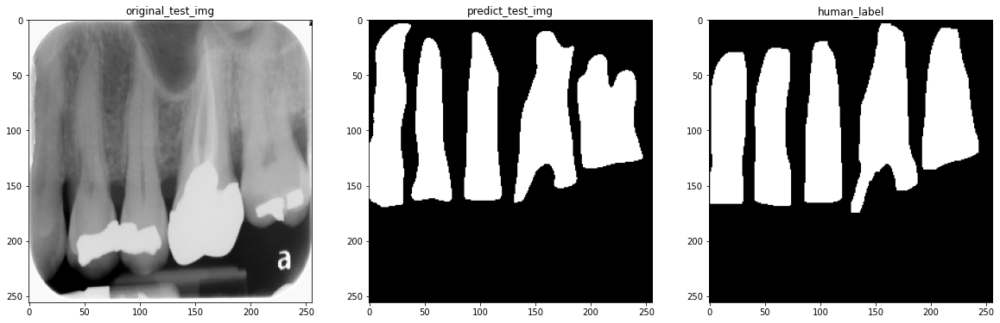


 37%|███▋      | 7/19 [00:03<00:05,  2.30it/s]

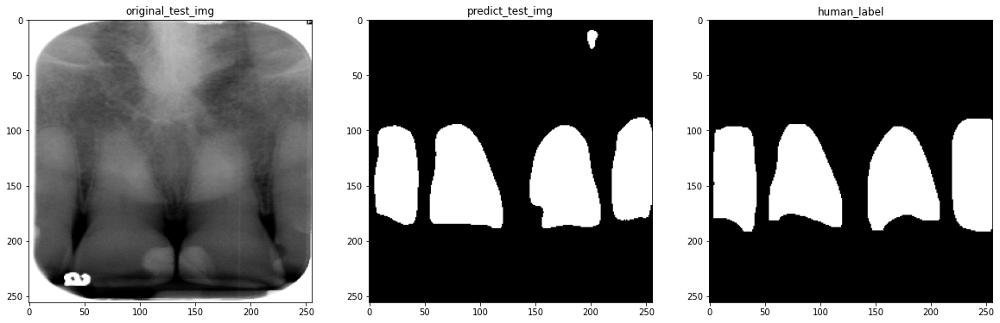


 42%|████▏     | 8/19 [00:03<00:04,  2.30it/s]

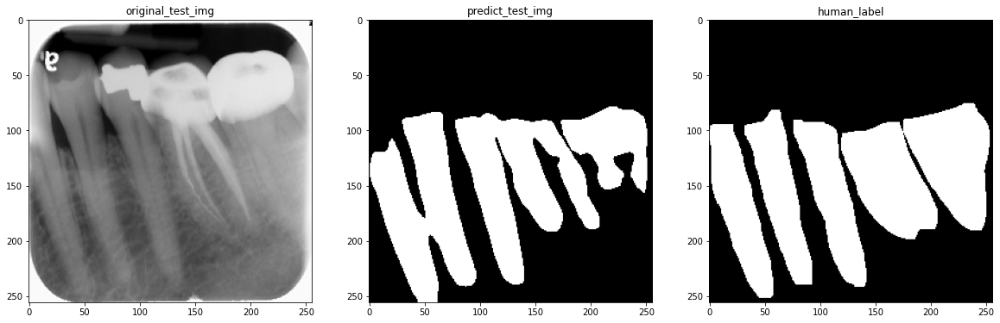


 47%|████▋     | 9/19 [00:03<00:04,  2.30it/s]

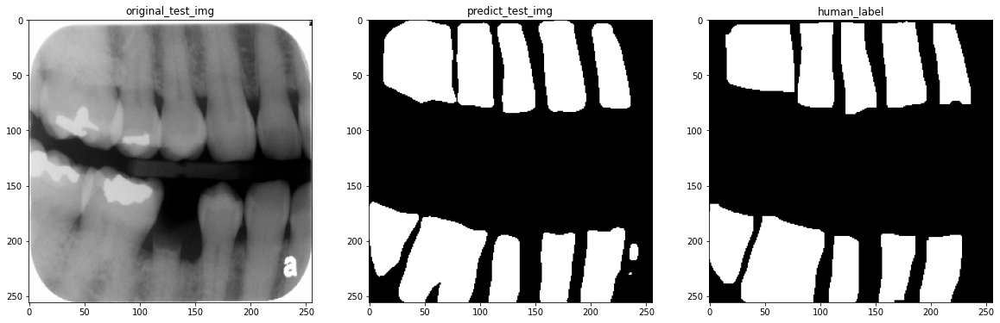


 53%|█████▎    | 10/19 [00:04<00:03,  2.30it/s]

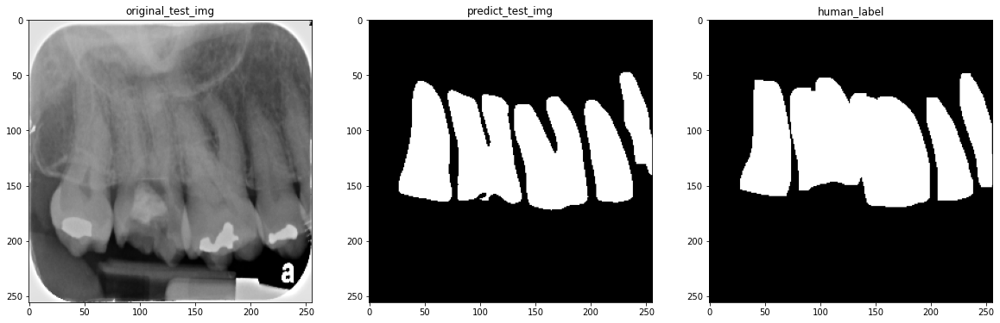


 58%|█████▊    | 11/19 [00:04<00:03,  2.30it/s]

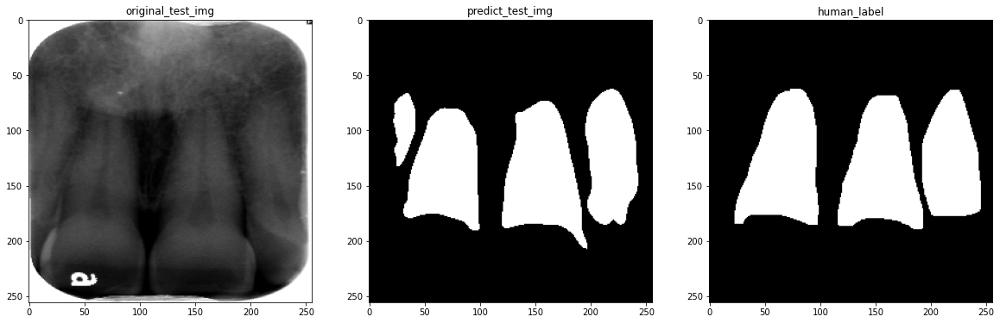


 63%|██████▎   | 12/19 [00:05<00:04,  1.69it/s]

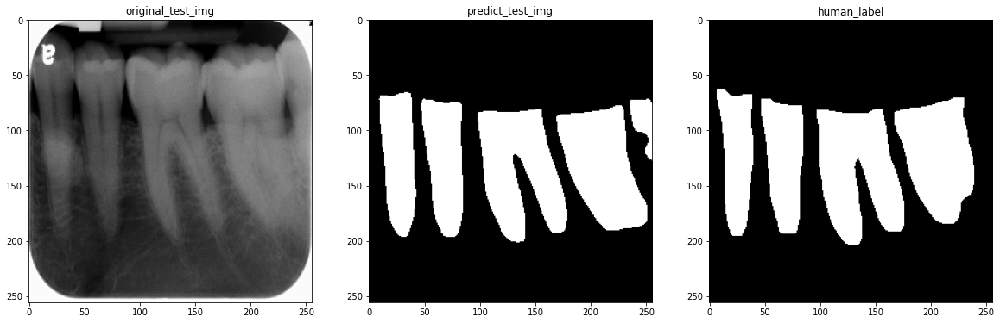


 68%|██████▊   | 13/19 [00:06<00:03,  1.84it/s]

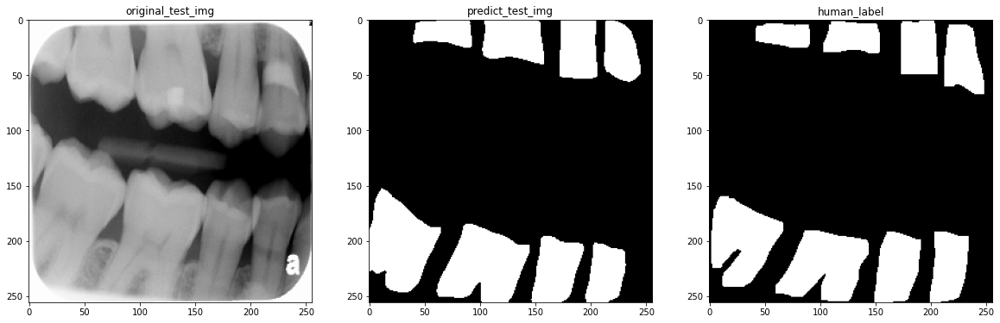


 74%|███████▎  | 14/19 [00:06<00:02,  1.95it/s]

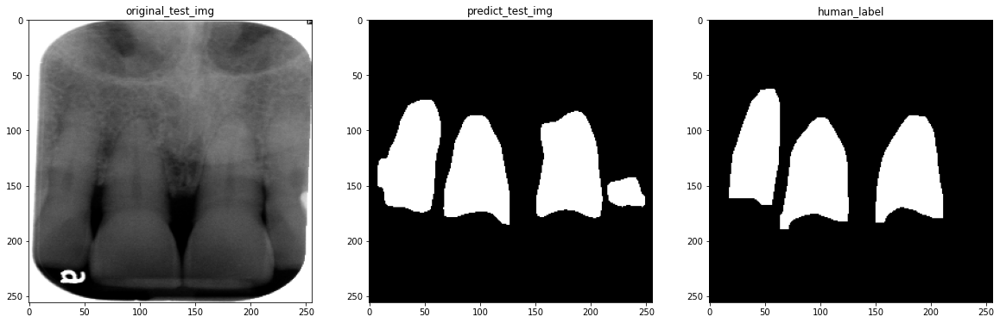


 79%|███████▉  | 15/19 [00:07<00:01,  2.05it/s]

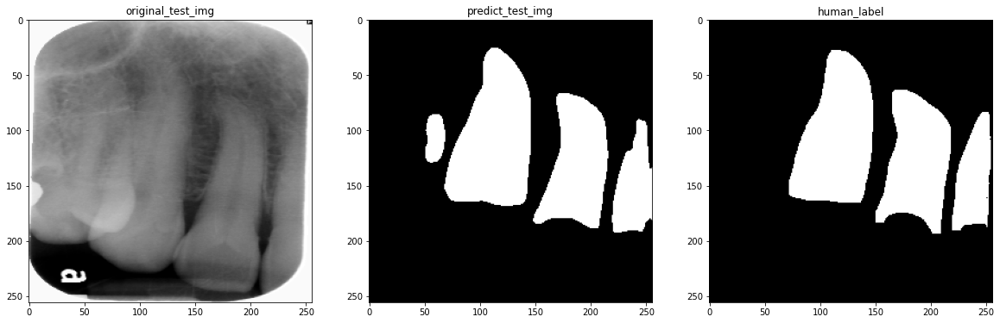


 84%|████████▍ | 16/19 [00:07<00:01,  2.12it/s]

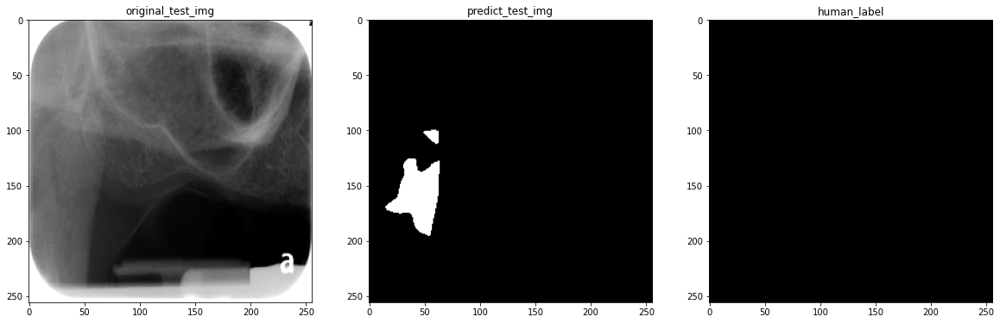


 89%|████████▉ | 17/19 [00:07<00:00,  2.18it/s]

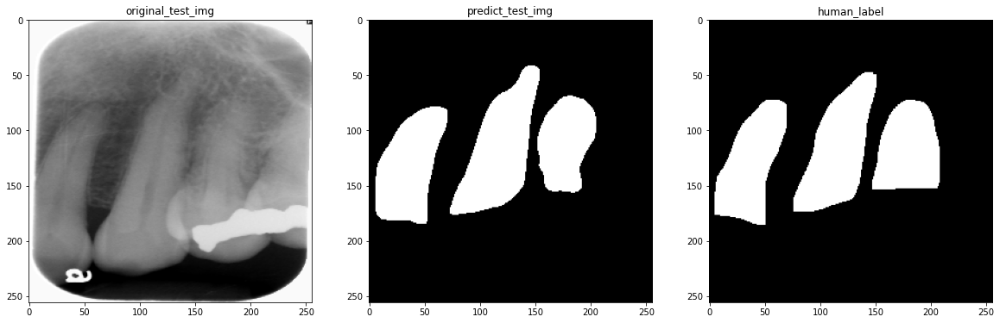


 95%|█████████▍| 18/19 [00:08<00:00,  2.22it/s]

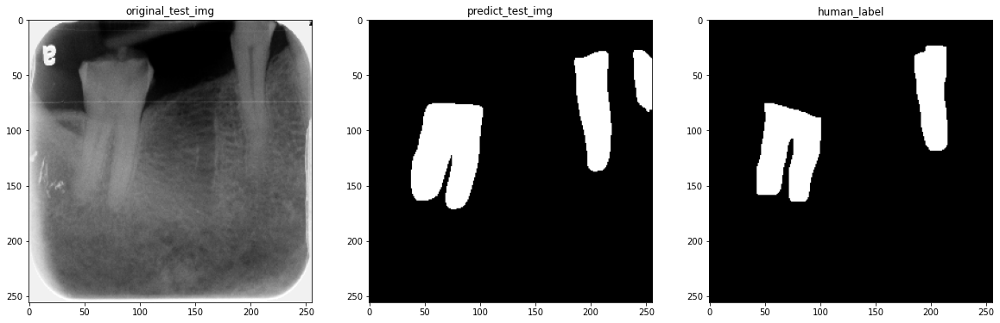


  0%|          | 0/19 [00:00<?, ?it/s]

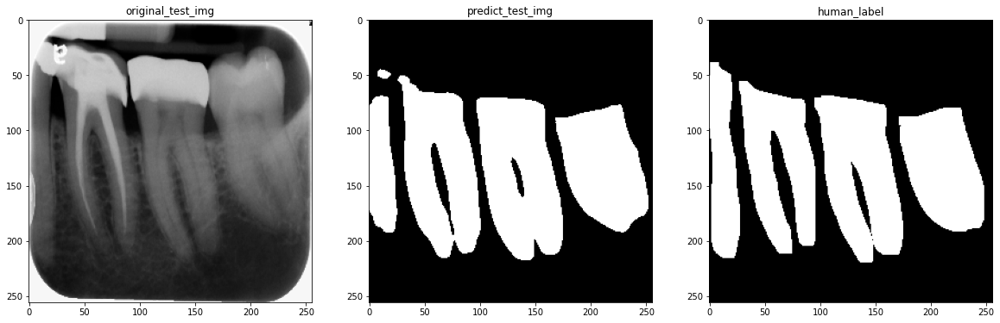


  5%|▌         | 1/19 [00:00<00:07,  2.32it/s]

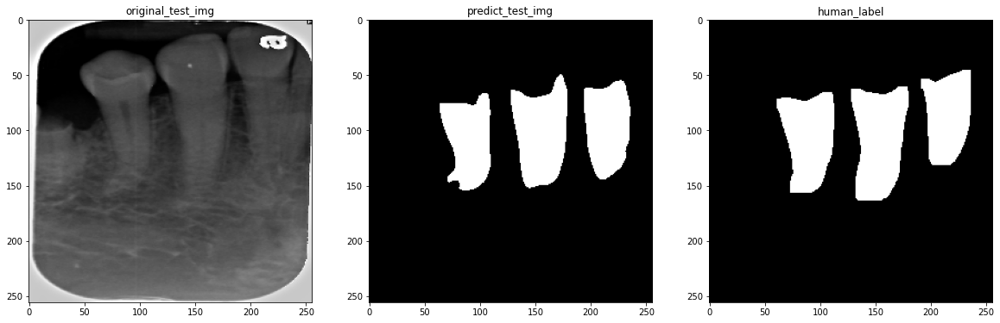


 11%|█         | 2/19 [00:00<00:07,  2.32it/s]

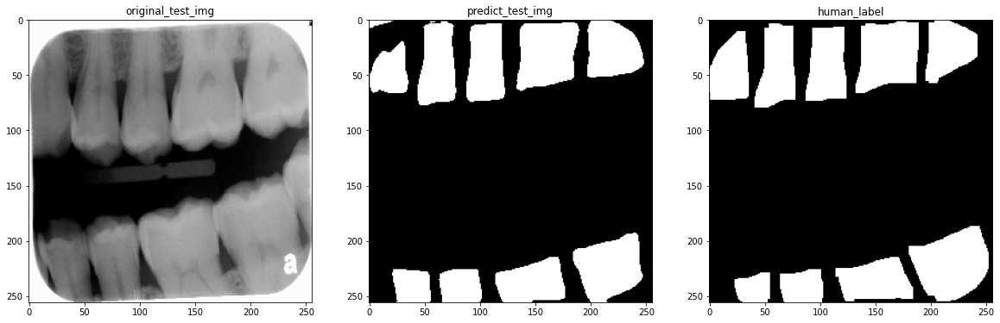


 16%|█▌        | 3/19 [00:01<00:06,  2.32it/s]

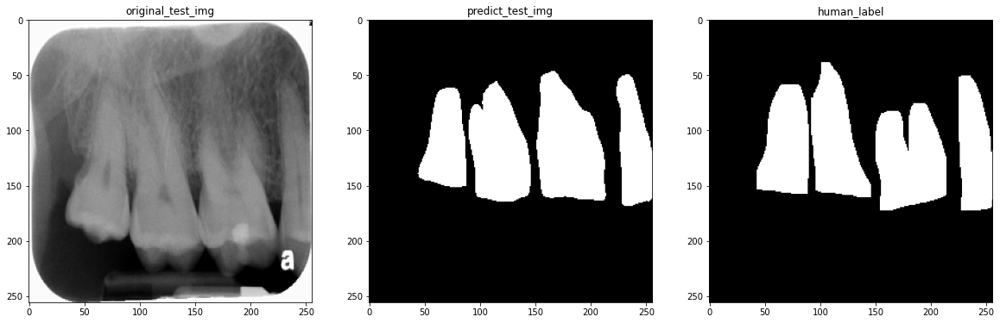


 21%|██        | 4/19 [00:01<00:06,  2.31it/s]

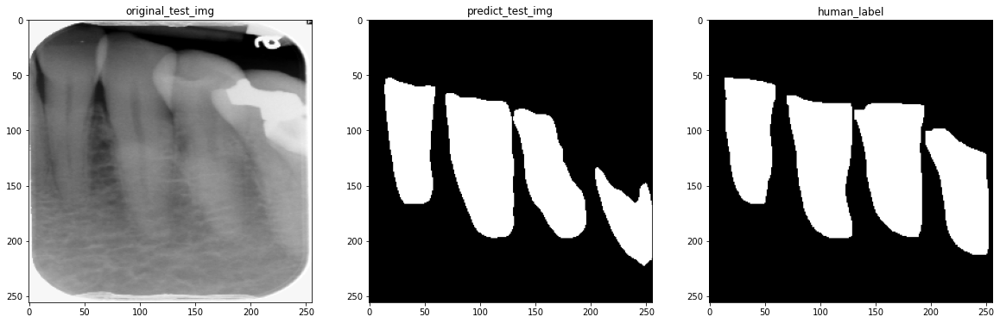


 26%|██▋       | 5/19 [00:02<00:06,  2.32it/s]

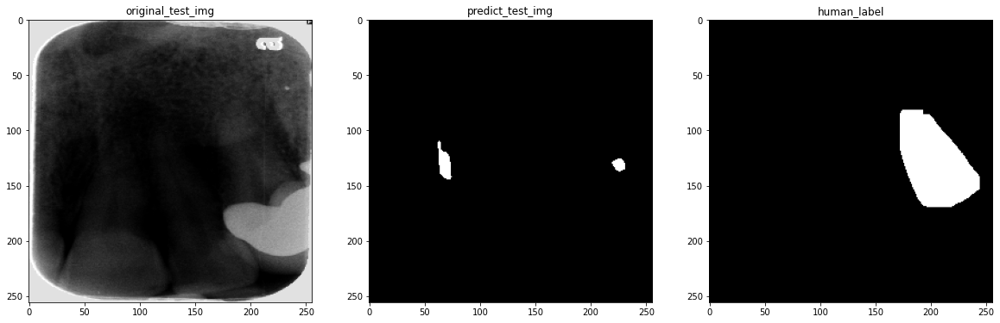


 32%|███▏      | 6/19 [00:02<00:05,  2.32it/s]

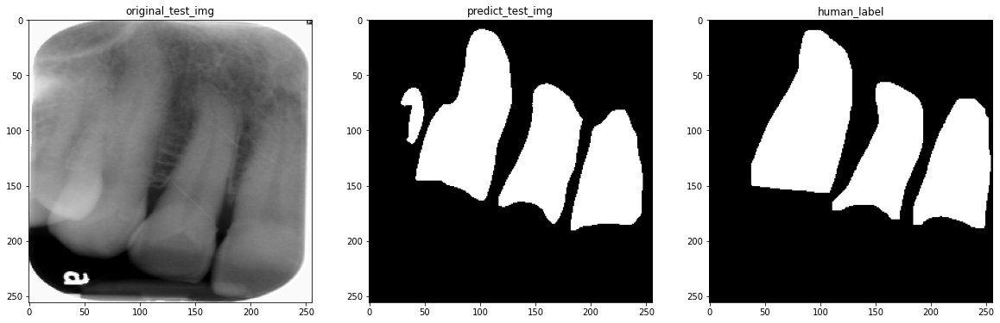


 37%|███▋      | 7/19 [00:03<00:05,  2.32it/s]

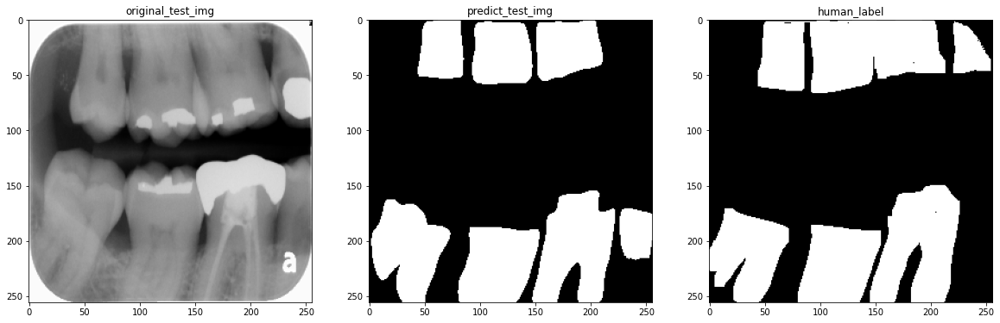


 42%|████▏     | 8/19 [00:03<00:04,  2.32it/s]

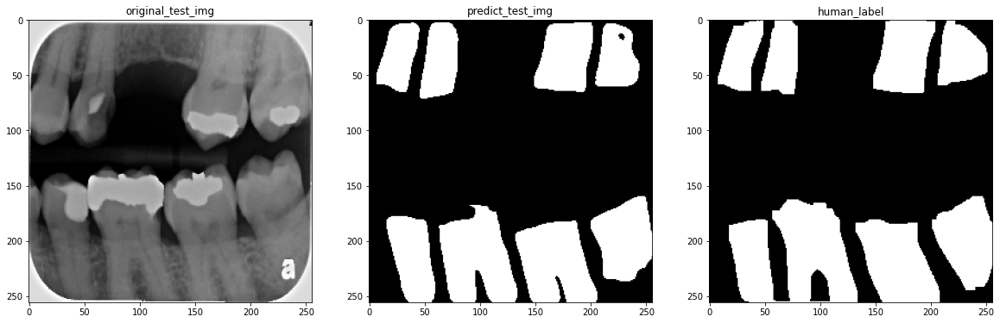


 47%|████▋     | 9/19 [00:03<00:04,  2.31it/s]

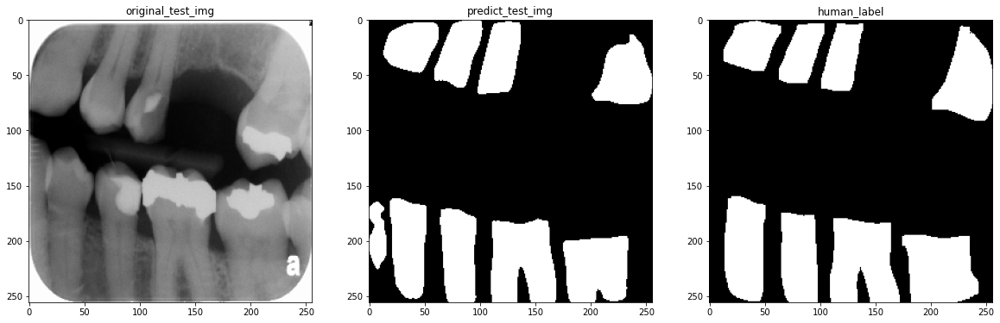


 53%|█████▎    | 10/19 [00:04<00:03,  2.31it/s]

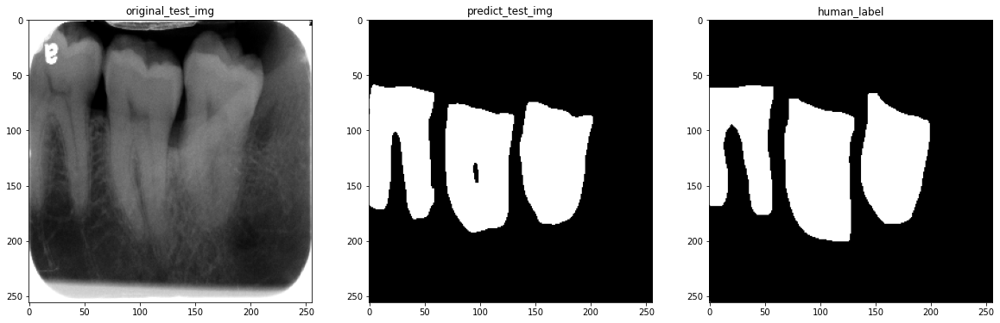


 58%|█████▊    | 11/19 [00:04<00:03,  2.31it/s]

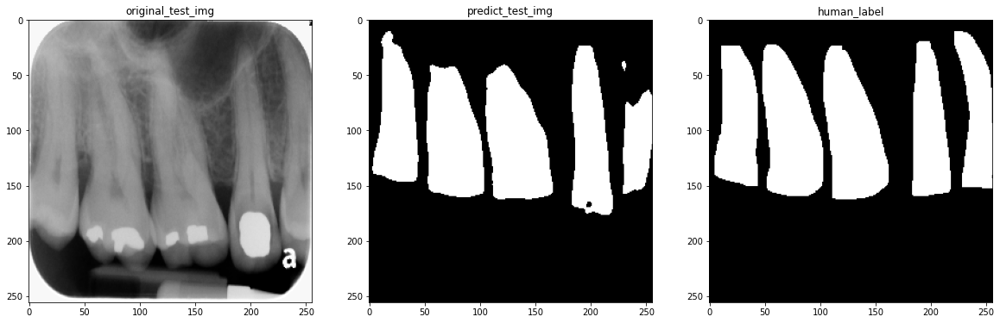


 63%|██████▎   | 12/19 [00:05<00:03,  2.31it/s]

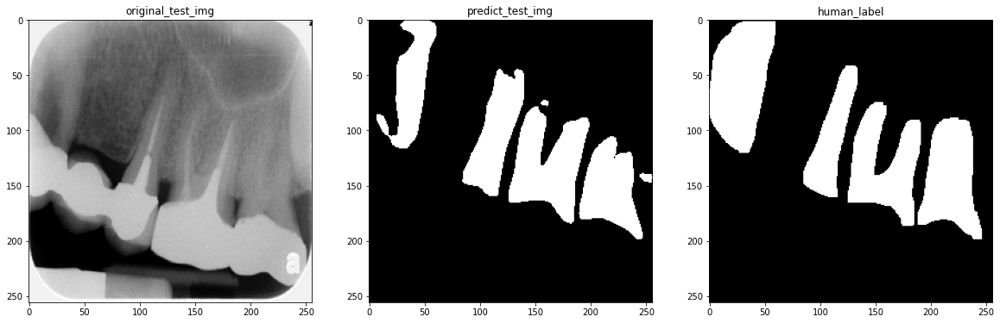


 68%|██████▊   | 13/19 [00:05<00:02,  2.31it/s]

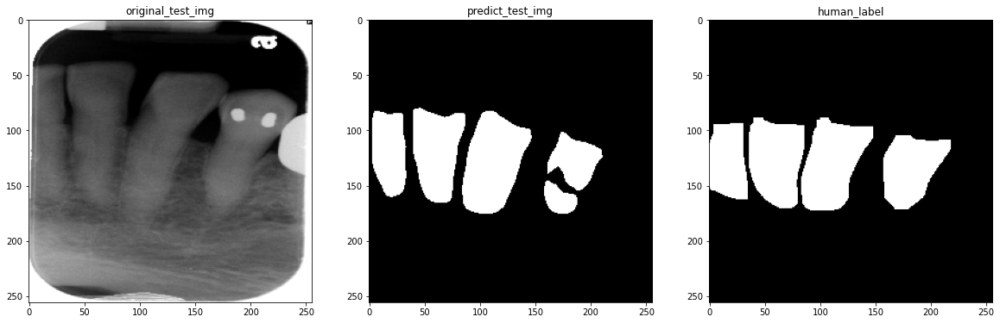


 74%|███████▎  | 14/19 [00:06<00:02,  2.32it/s]

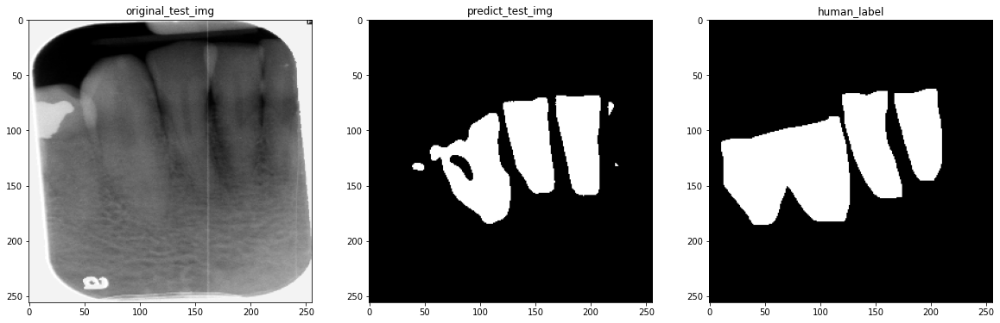


 79%|███████▉  | 15/19 [00:06<00:01,  2.32it/s]

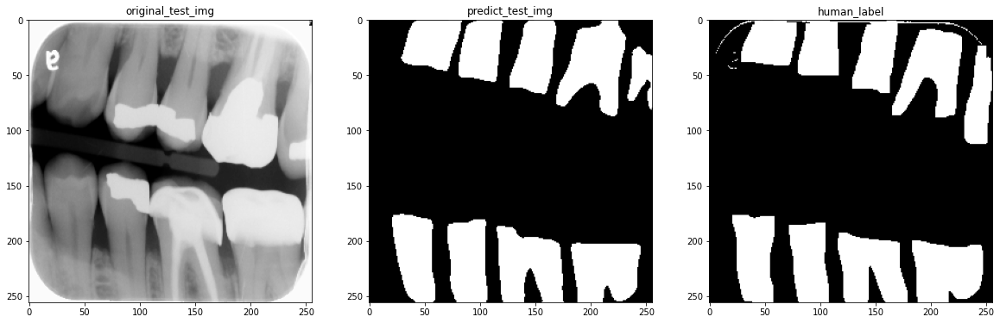


 84%|████████▍ | 16/19 [00:06<00:01,  2.32it/s]

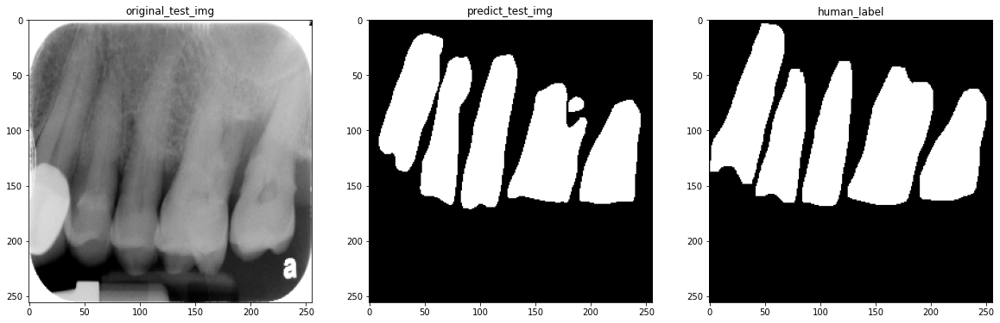


 89%|████████▉ | 17/19 [00:07<00:00,  2.32it/s]

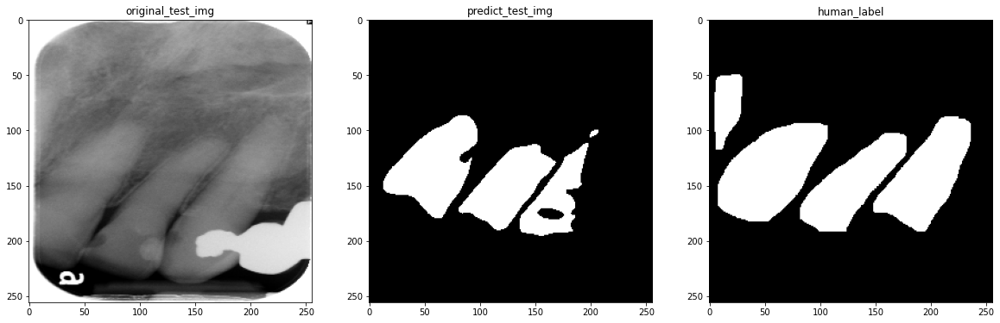


 95%|█████████▍| 18/19 [00:07<00:00,  2.32it/s]

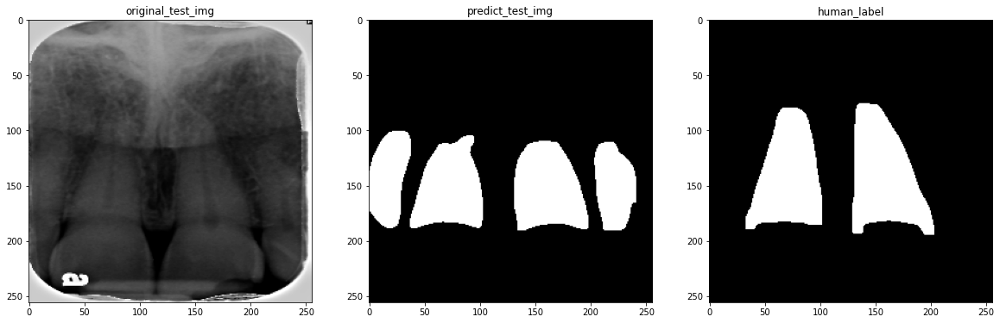


  0%|          | 0/19 [00:00<?, ?it/s]

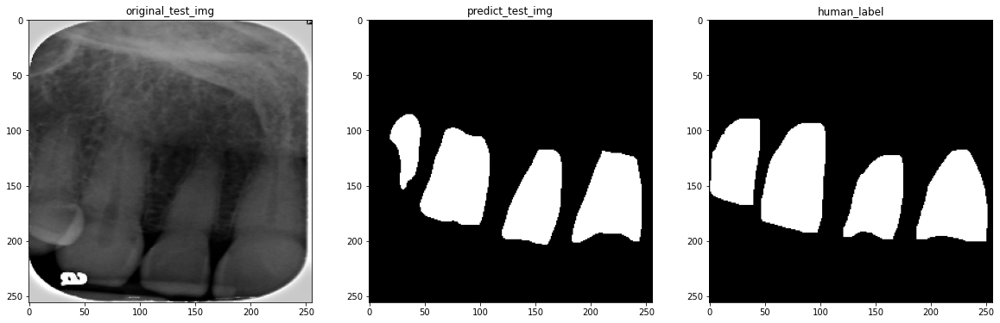


  5%|▌         | 1/19 [00:00<00:07,  2.34it/s]

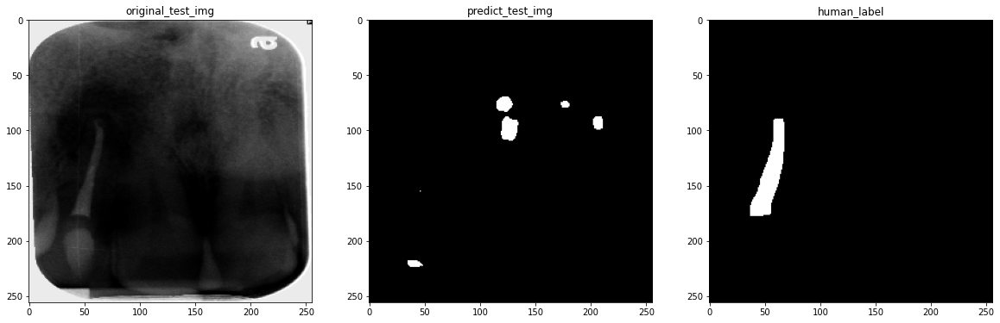


 11%|█         | 2/19 [00:00<00:07,  2.34it/s]

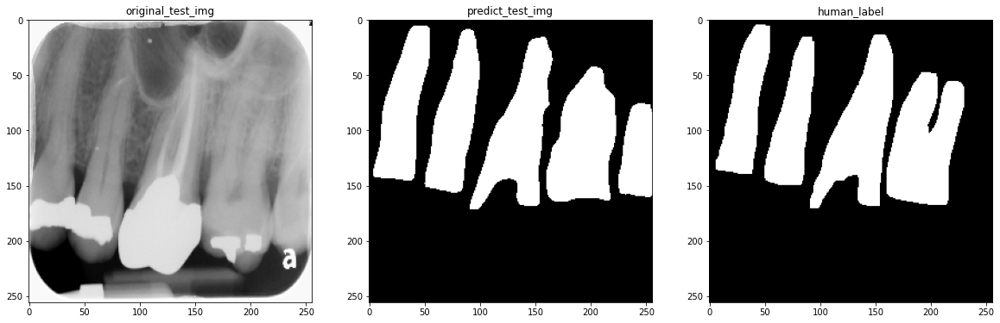


 16%|█▌        | 3/19 [00:01<00:06,  2.34it/s]

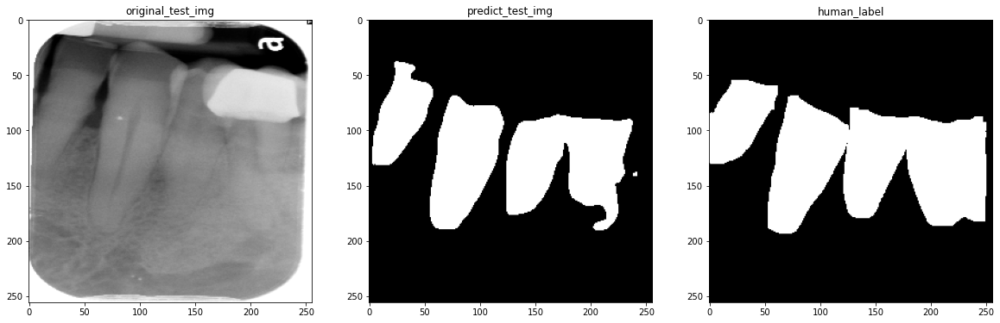


 21%|██        | 4/19 [00:01<00:06,  2.33it/s]

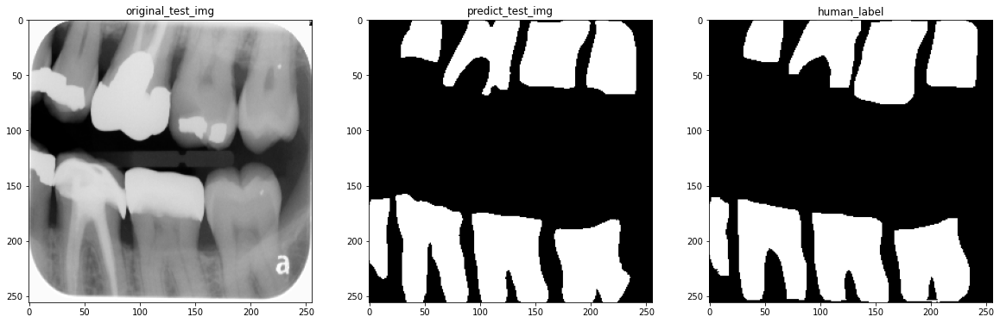


 26%|██▋       | 5/19 [00:02<00:06,  2.33it/s]

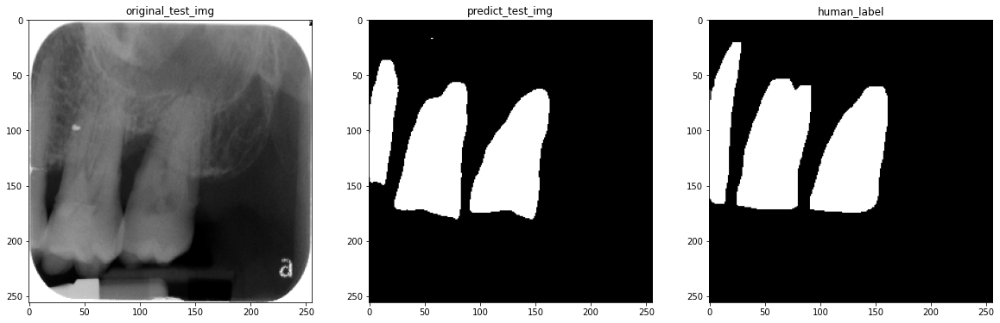


 32%|███▏      | 6/19 [00:02<00:05,  2.33it/s]

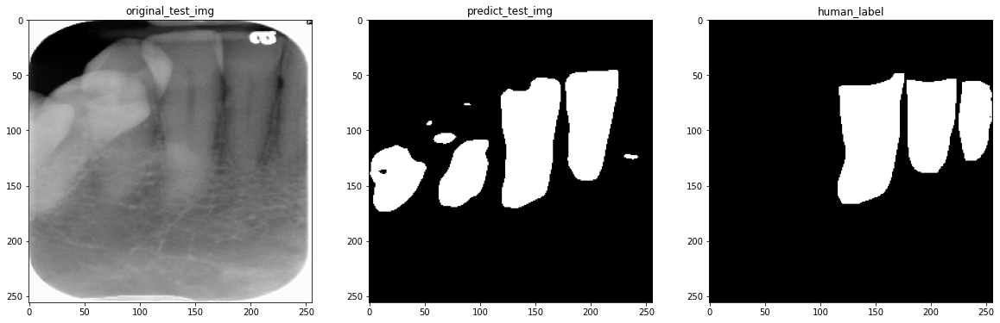


 37%|███▋      | 7/19 [00:03<00:05,  2.33it/s]

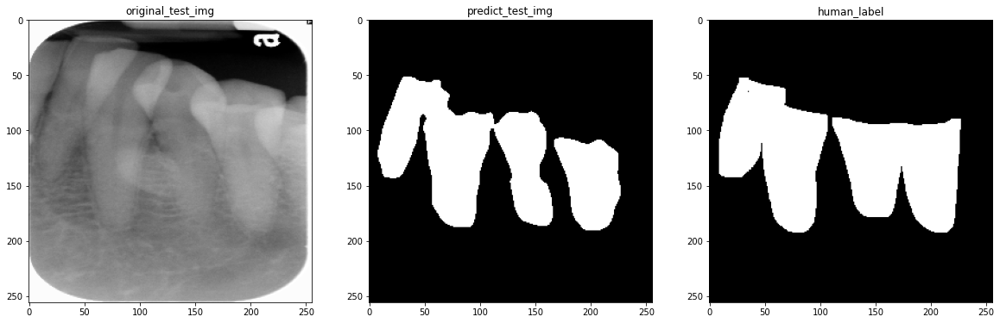


 42%|████▏     | 8/19 [00:03<00:04,  2.33it/s]

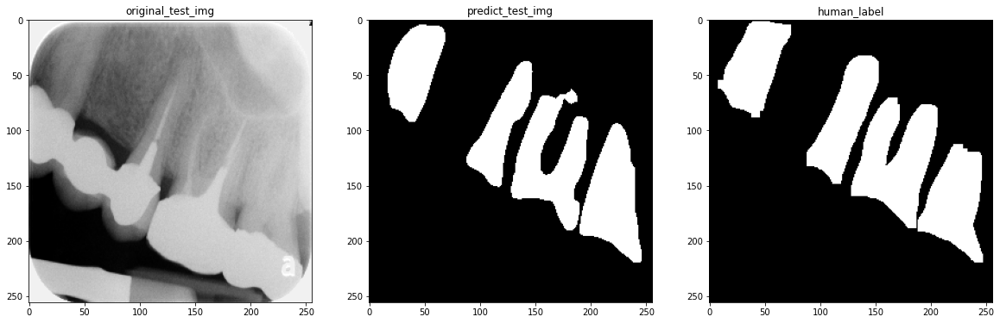


 47%|████▋     | 9/19 [00:03<00:04,  2.32it/s]

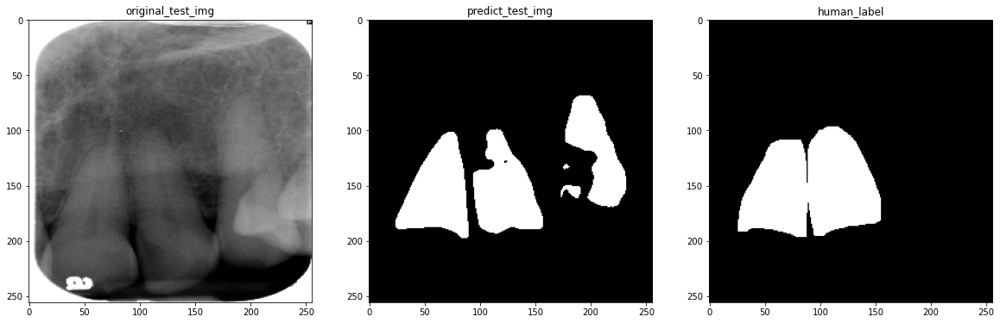


 53%|█████▎    | 10/19 [00:04<00:03,  2.32it/s]

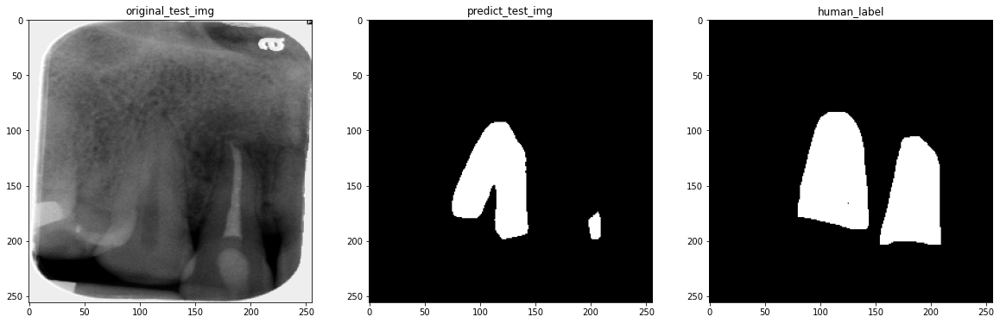


 58%|█████▊    | 11/19 [00:04<00:03,  2.32it/s]

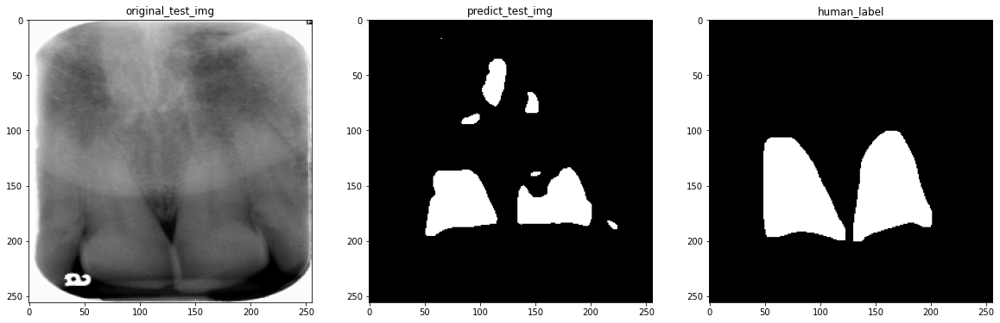


 63%|██████▎   | 12/19 [00:05<00:03,  2.32it/s]

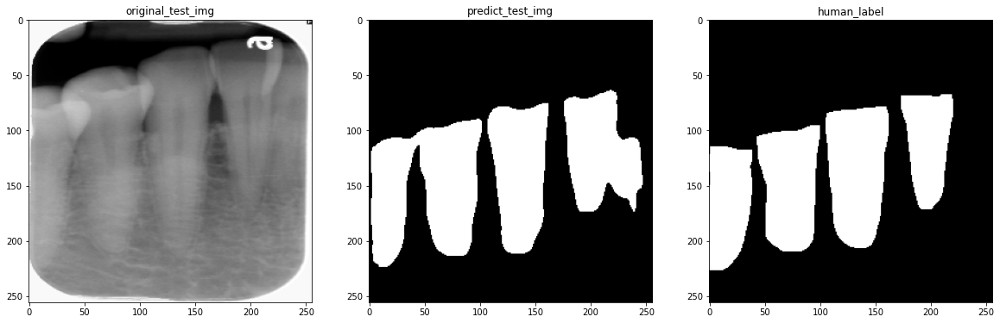


 68%|██████▊   | 13/19 [00:05<00:02,  2.33it/s]

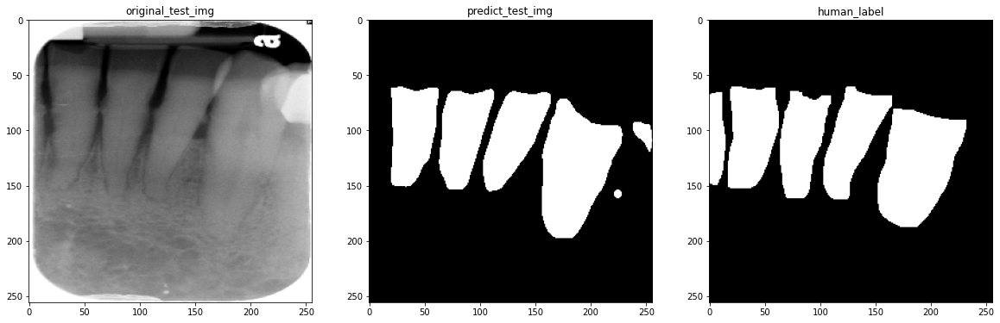


 74%|███████▎  | 14/19 [00:06<00:02,  2.33it/s]

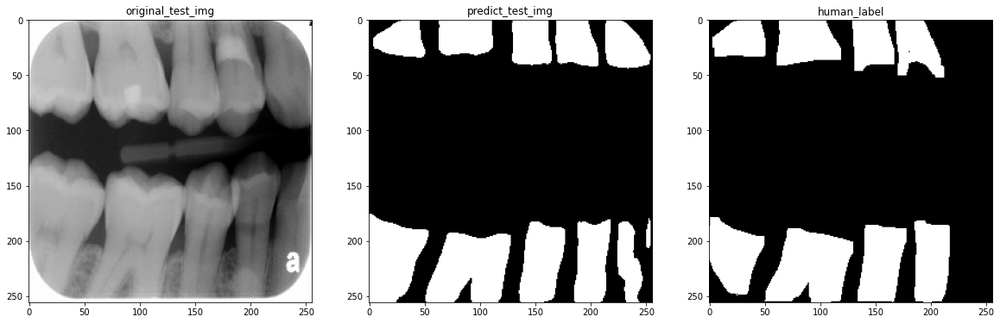


 79%|███████▉  | 15/19 [00:06<00:01,  2.32it/s]

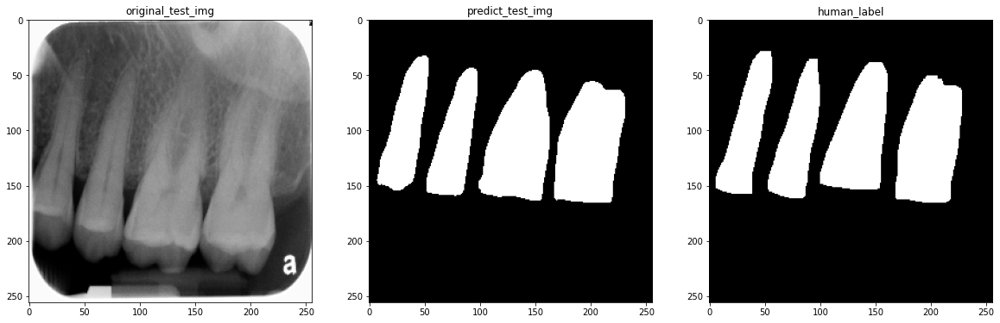


 84%|████████▍ | 16/19 [00:06<00:01,  2.32it/s]

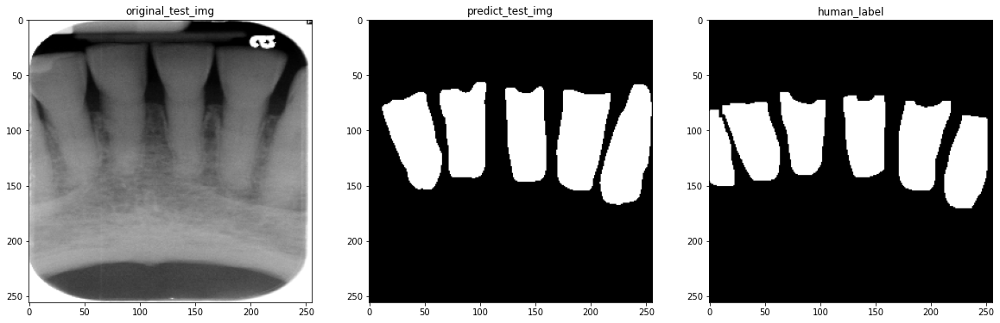


 89%|████████▉ | 17/19 [00:07<00:00,  2.32it/s]

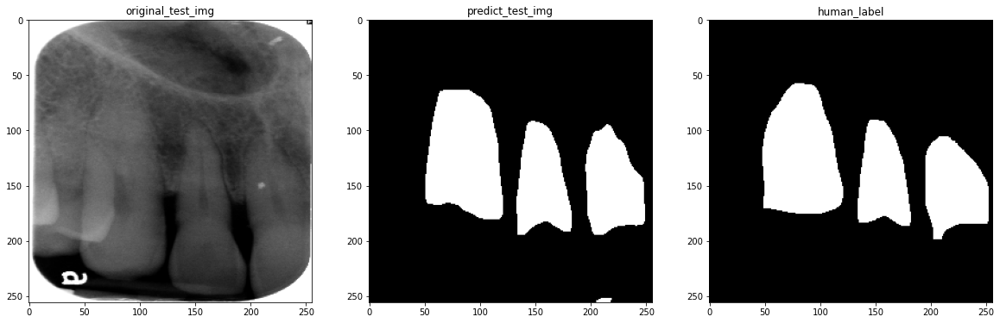


 95%|█████████▍| 18/19 [00:07<00:00,  2.32it/s]

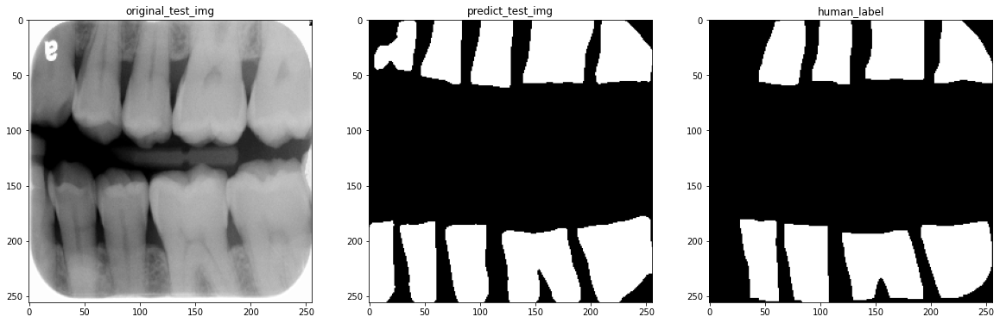


  0%|          | 0/19 [00:00<?, ?it/s]

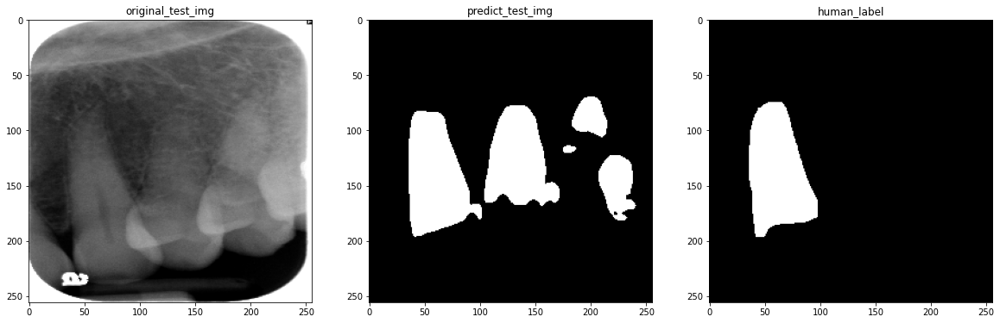


  5%|▌         | 1/19 [00:00<00:07,  2.33it/s]

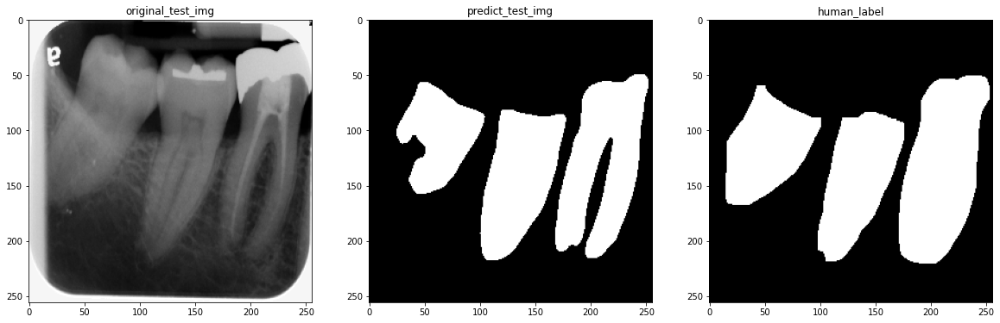


 11%|█         | 2/19 [00:00<00:07,  2.32it/s]

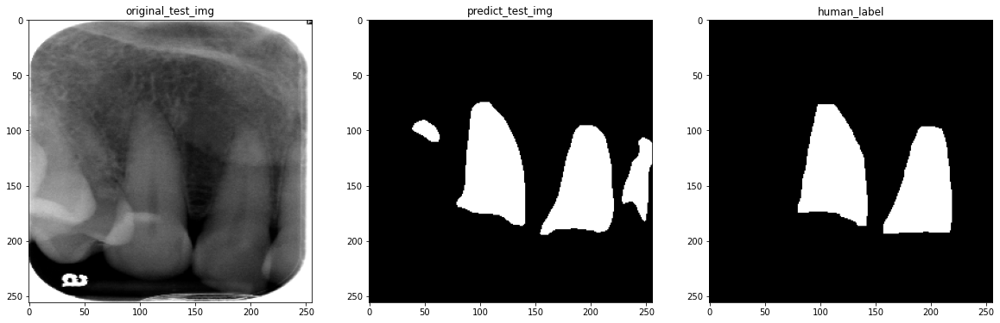


 16%|█▌        | 3/19 [00:01<00:06,  2.32it/s]

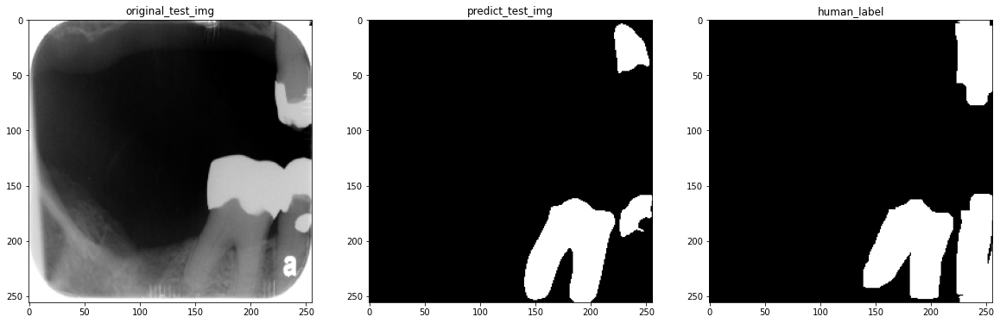


 21%|██        | 4/19 [00:01<00:06,  2.33it/s]

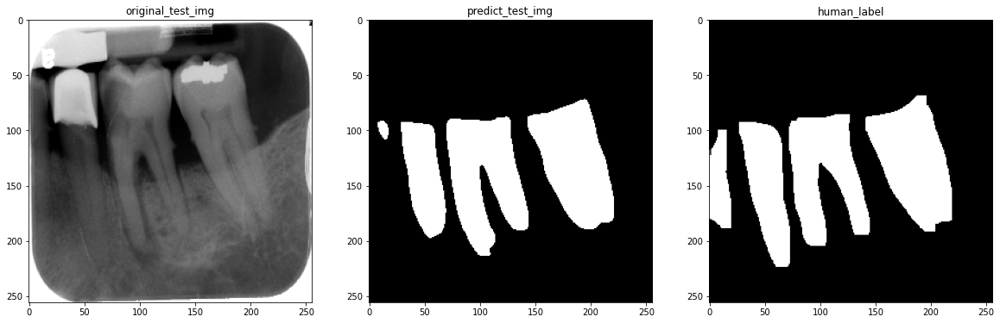


 26%|██▋       | 5/19 [00:02<00:08,  1.70it/s]

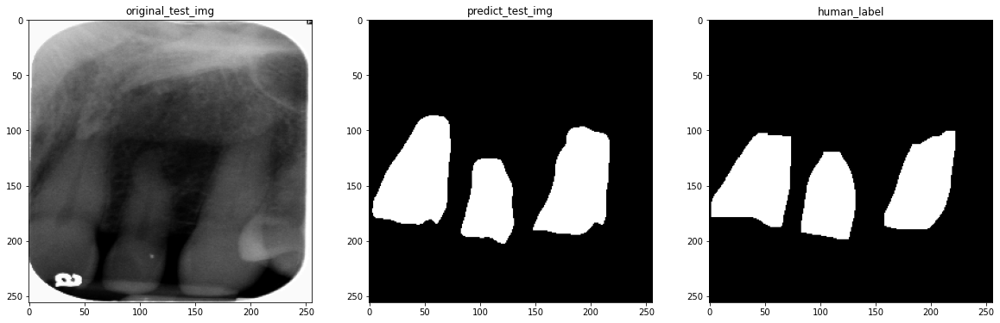


 32%|███▏      | 6/19 [00:03<00:07,  1.85it/s]

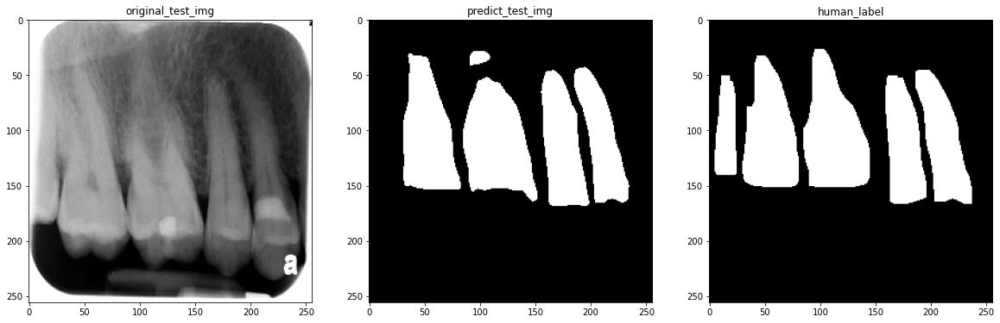


 37%|███▋      | 7/19 [00:03<00:06,  1.96it/s]

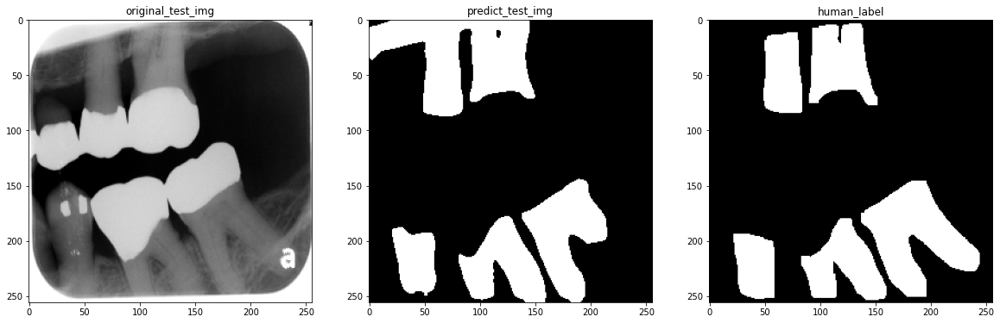


 42%|████▏     | 8/19 [00:03<00:05,  2.05it/s]

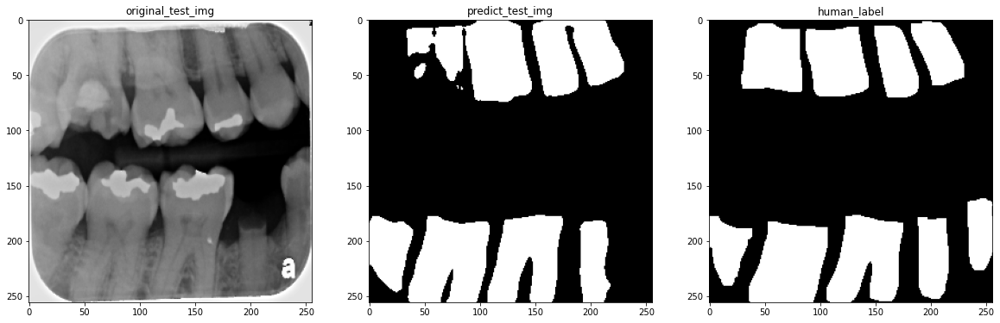


 47%|████▋     | 9/19 [00:04<00:04,  2.12it/s]

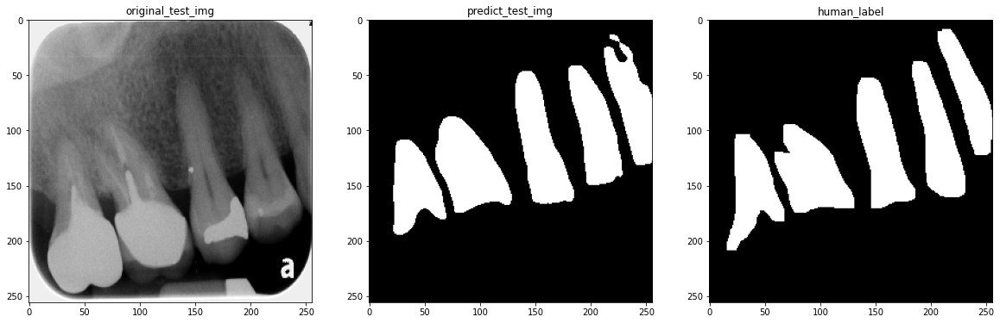


 53%|█████▎    | 10/19 [00:04<00:04,  2.17it/s]

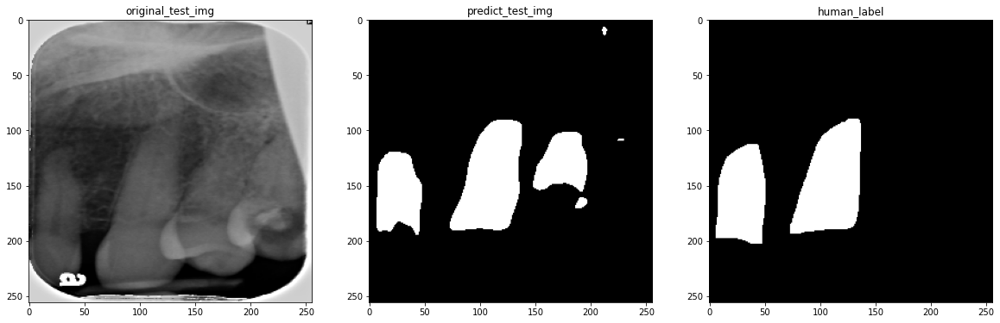


 58%|█████▊    | 11/19 [00:05<00:03,  2.21it/s]

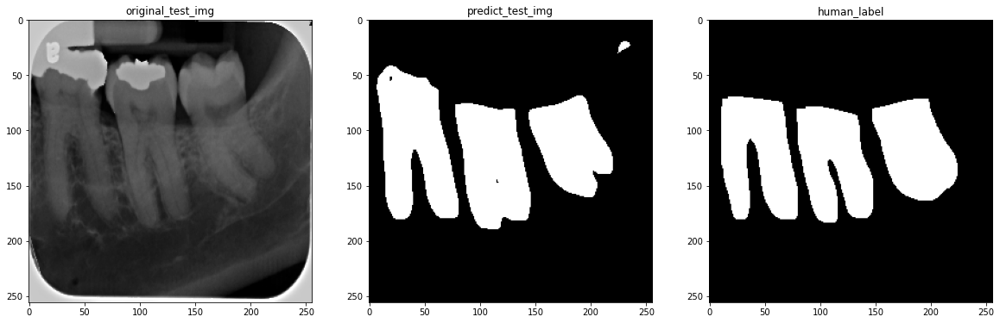


 63%|██████▎   | 12/19 [00:05<00:03,  2.24it/s]

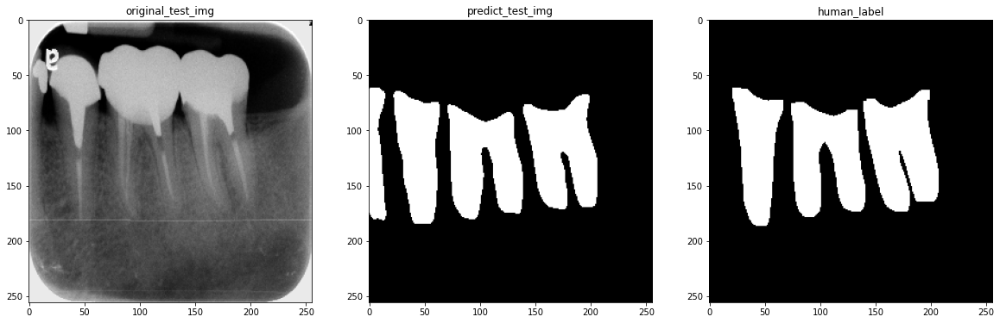


 68%|██████▊   | 13/19 [00:06<00:02,  2.26it/s]

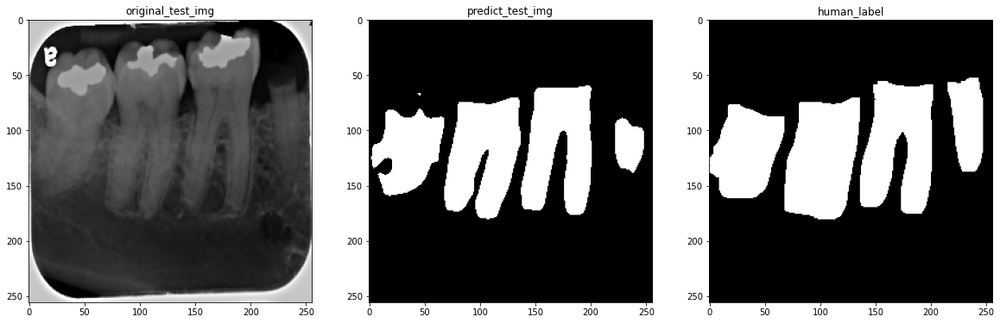


 74%|███████▎  | 14/19 [00:06<00:02,  2.28it/s]

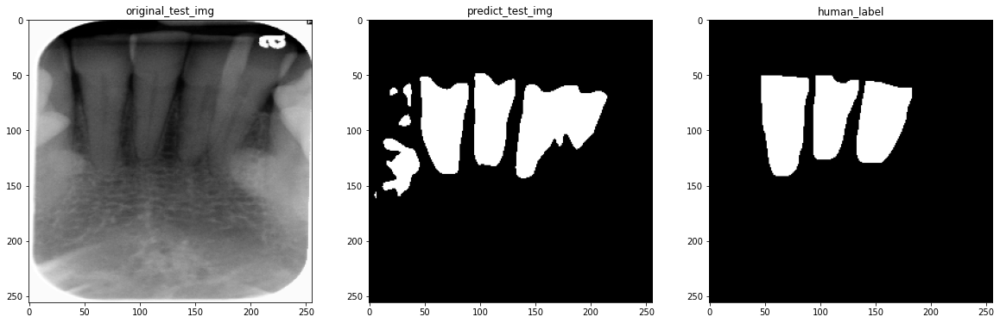


 79%|███████▉  | 15/19 [00:07<00:01,  2.29it/s]

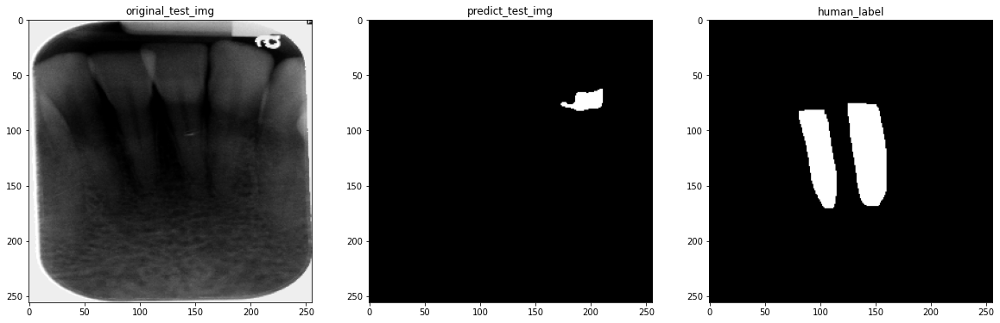


 84%|████████▍ | 16/19 [00:07<00:01,  2.30it/s]

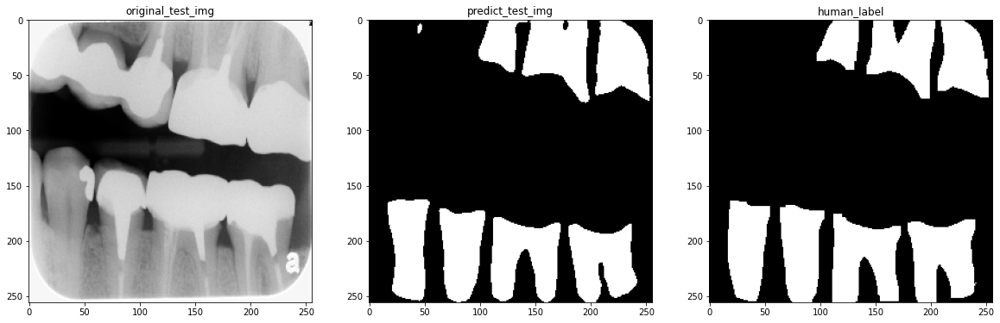


 89%|████████▉ | 17/19 [00:07<00:00,  2.30it/s]

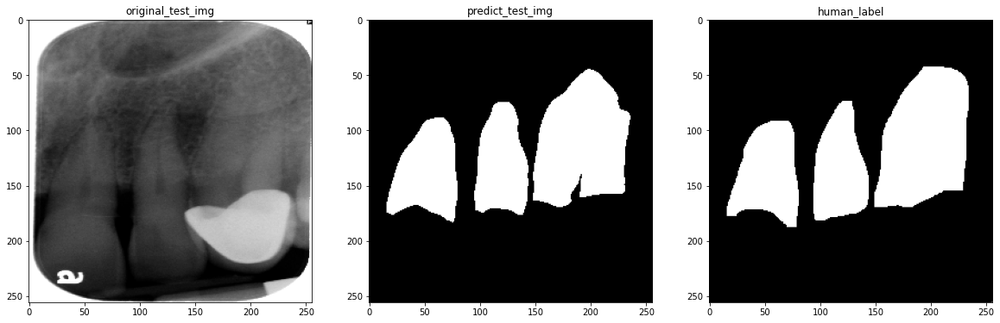


 95%|█████████▍| 18/19 [00:08<00:00,  2.30it/s]

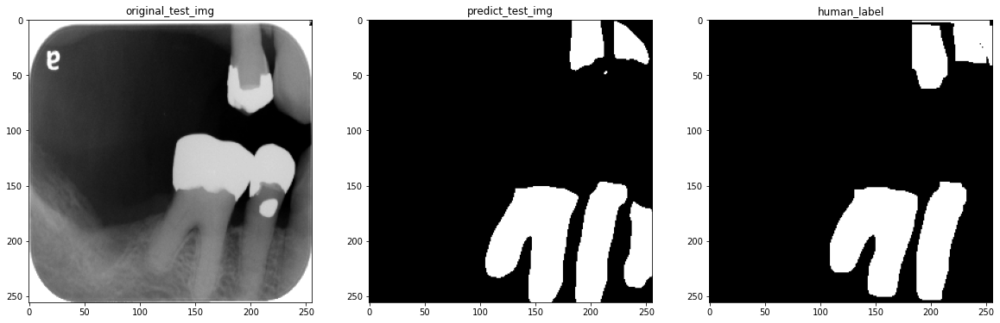


  0%|          | 0/19 [00:00<?, ?it/s]

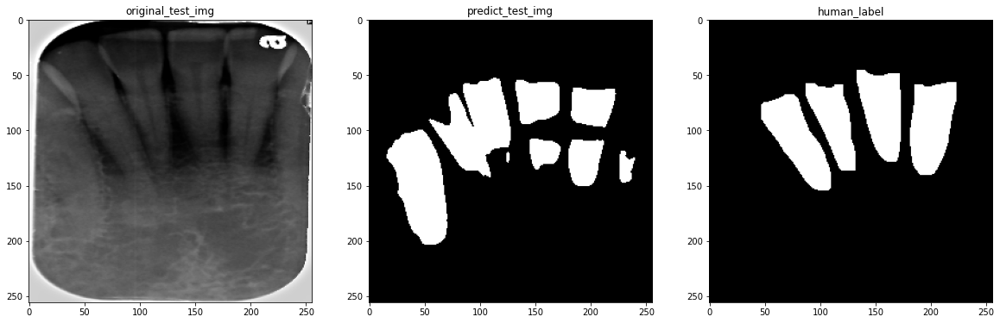


  5%|▌         | 1/19 [00:00<00:07,  2.33it/s]

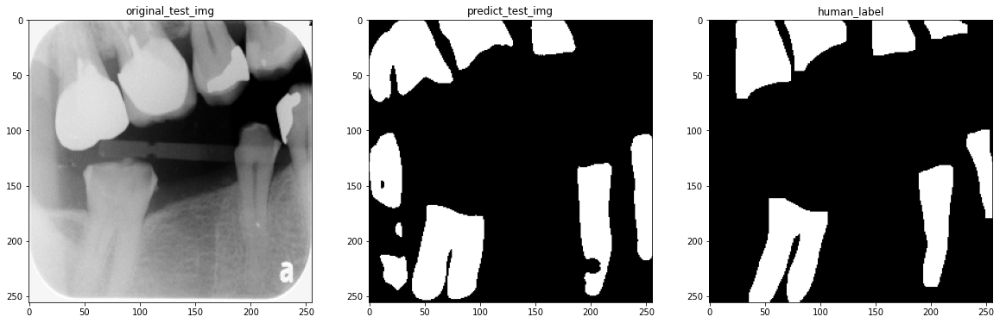


 11%|█         | 2/19 [00:00<00:07,  2.32it/s]

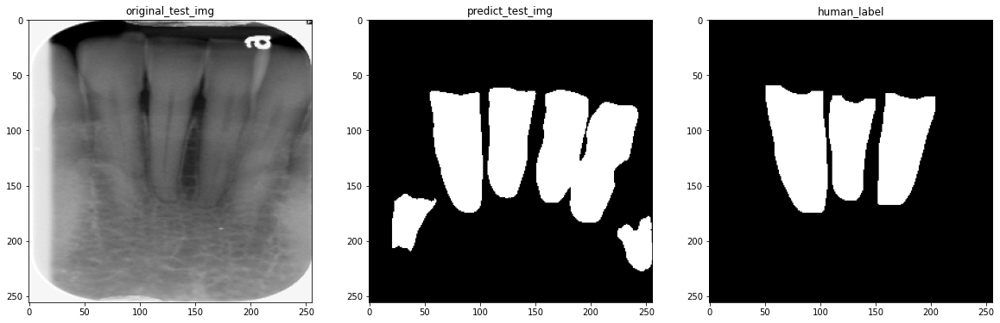


 16%|█▌        | 3/19 [00:01<00:06,  2.32it/s]

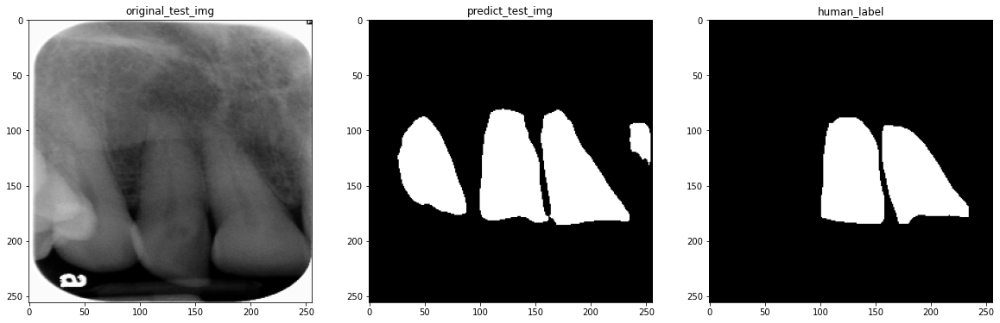


 21%|██        | 4/19 [00:01<00:06,  2.32it/s]

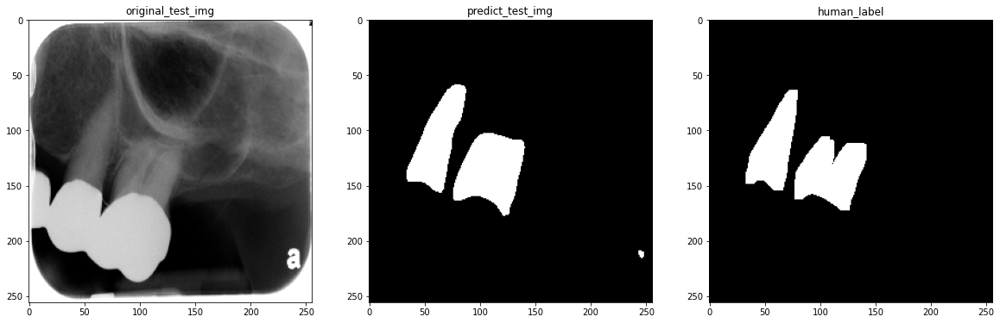


 26%|██▋       | 5/19 [00:02<00:06,  2.32it/s]

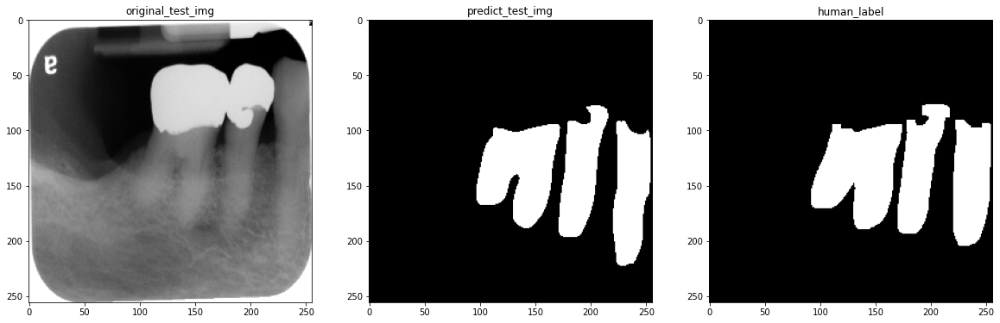


 32%|███▏      | 6/19 [00:02<00:05,  2.32it/s]

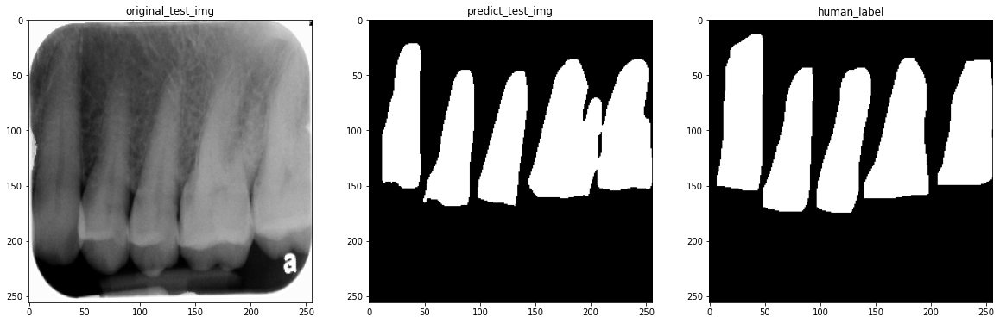


 37%|███▋      | 7/19 [00:03<00:05,  2.32it/s]

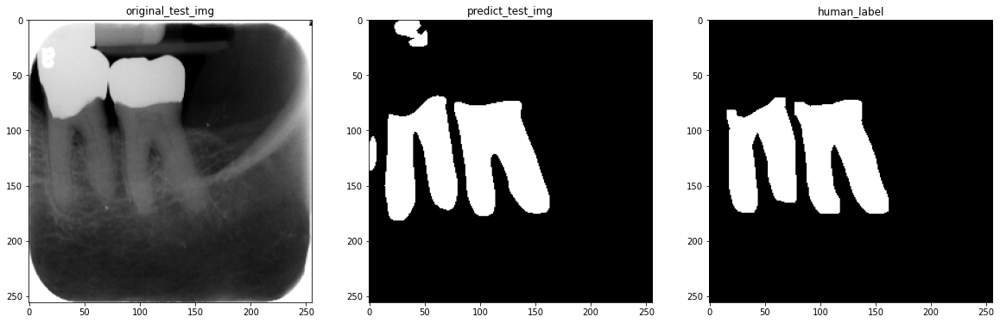


 42%|████▏     | 8/19 [00:03<00:04,  2.32it/s]

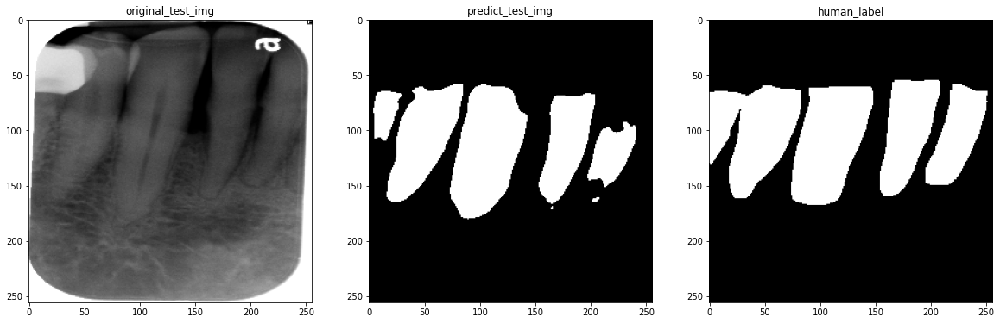


 47%|████▋     | 9/19 [00:03<00:04,  2.32it/s]

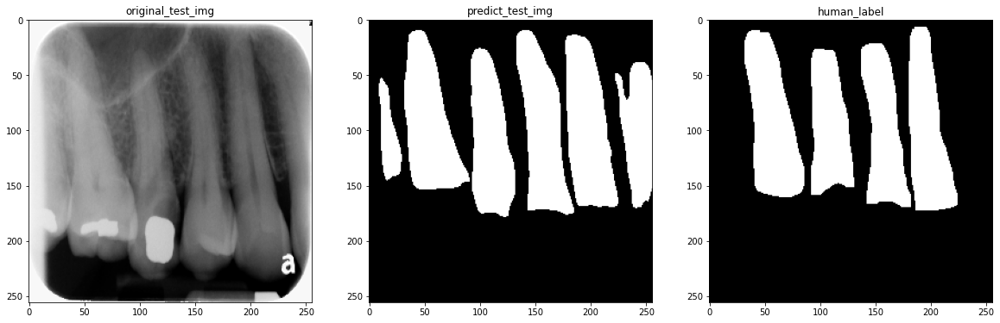


 53%|█████▎    | 10/19 [00:04<00:03,  2.32it/s]

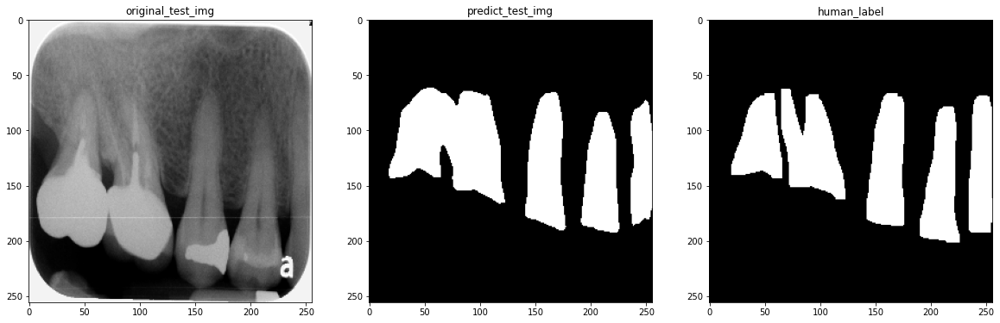


 58%|█████▊    | 11/19 [00:04<00:03,  2.32it/s]

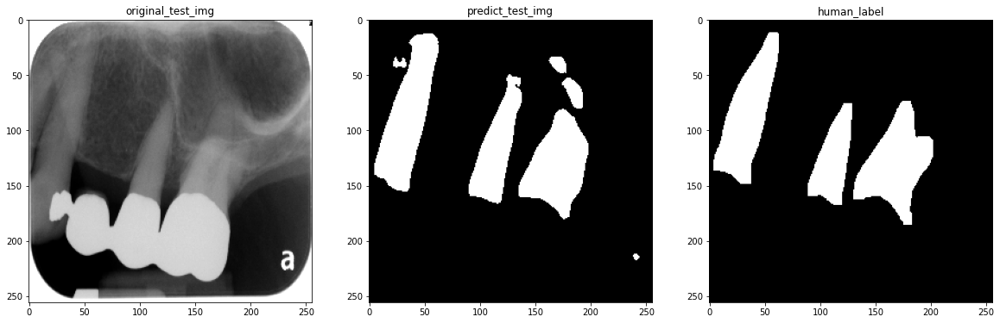


 63%|██████▎   | 12/19 [00:05<00:03,  2.32it/s]

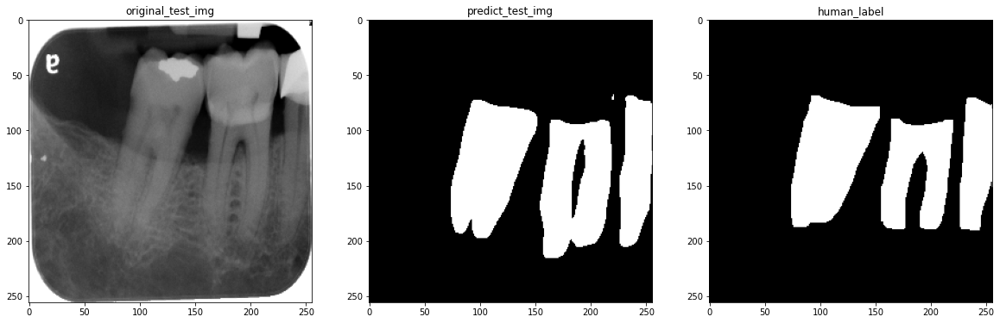


 68%|██████▊   | 13/19 [00:05<00:02,  2.32it/s]

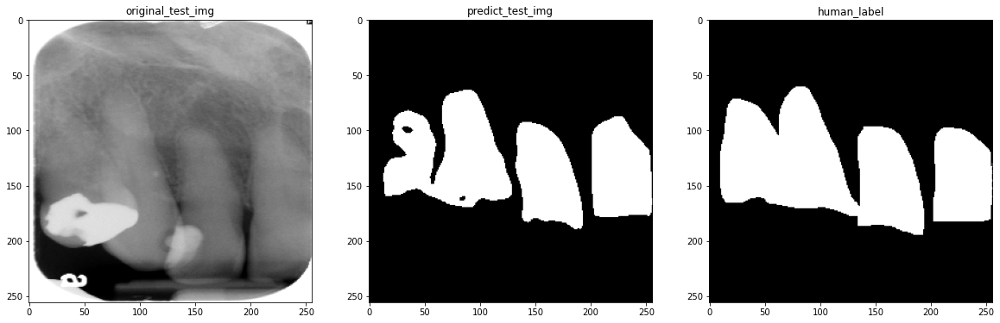


 74%|███████▎  | 14/19 [00:06<00:02,  2.32it/s]

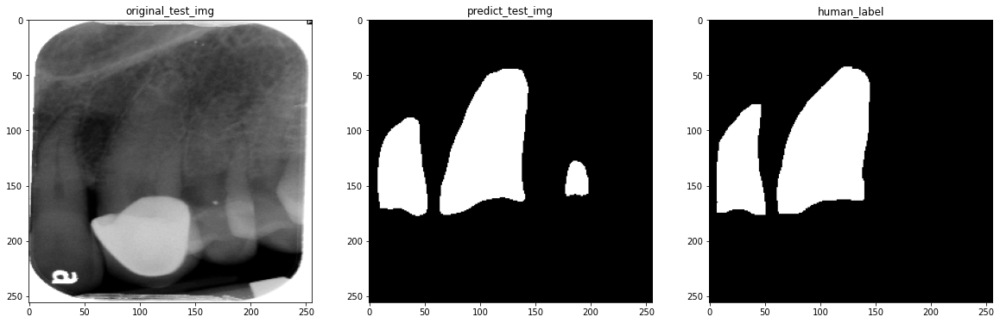


 79%|███████▉  | 15/19 [00:06<00:01,  2.32it/s]

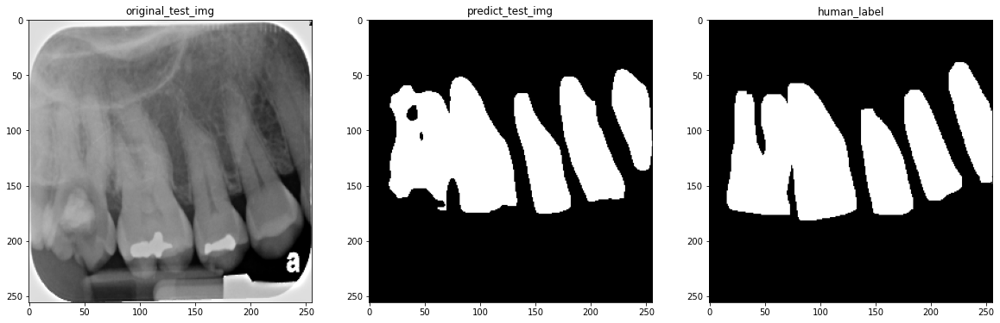


 84%|████████▍ | 16/19 [00:06<00:01,  2.32it/s]

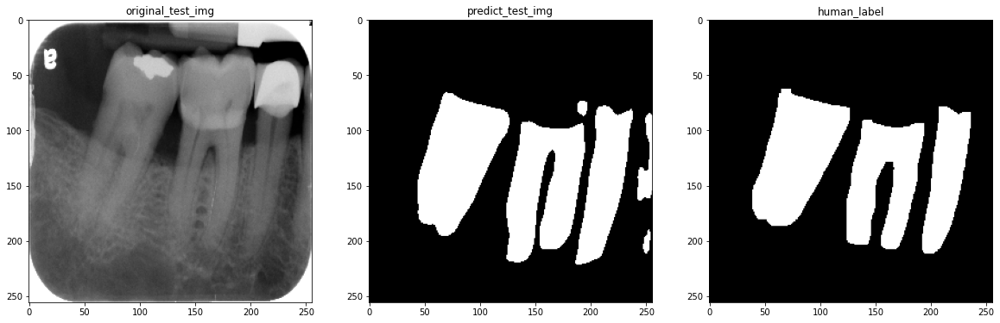


 89%|████████▉ | 17/19 [00:07<00:00,  2.31it/s]

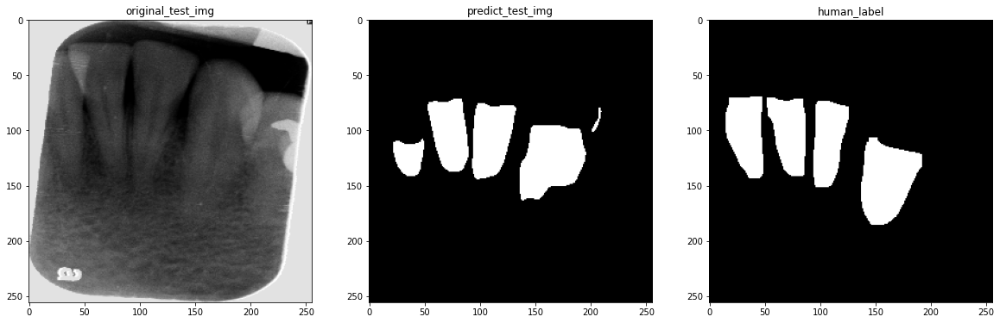


 95%|█████████▍| 18/19 [00:07<00:00,  2.31it/s]

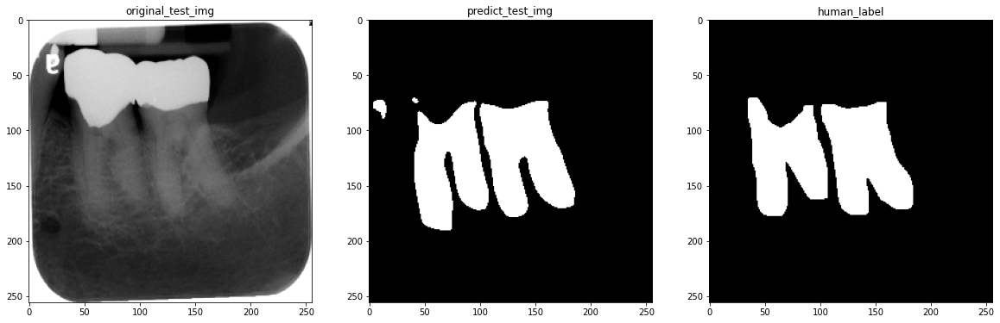


  0%|          | 0/19 [00:00<?, ?it/s]

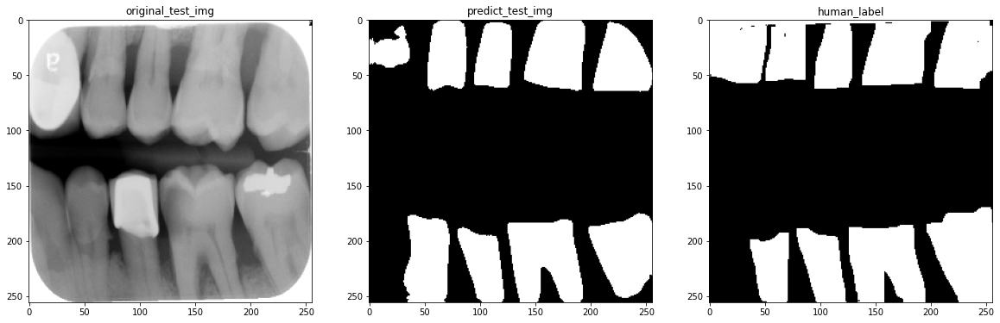


  5%|▌         | 1/19 [00:00<00:07,  2.32it/s]

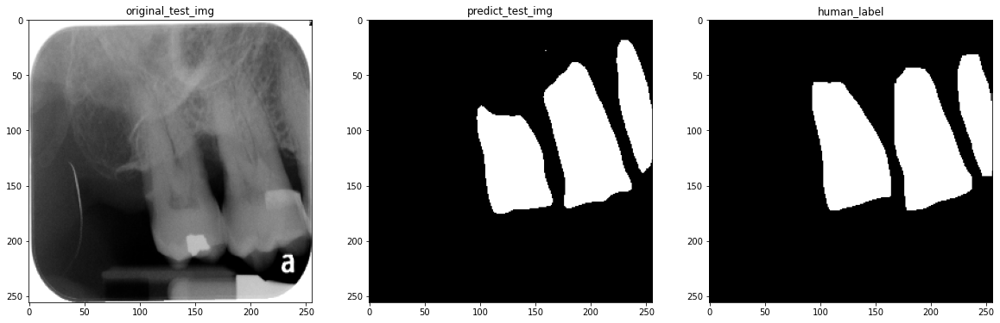


 11%|█         | 2/19 [00:00<00:07,  2.32it/s]

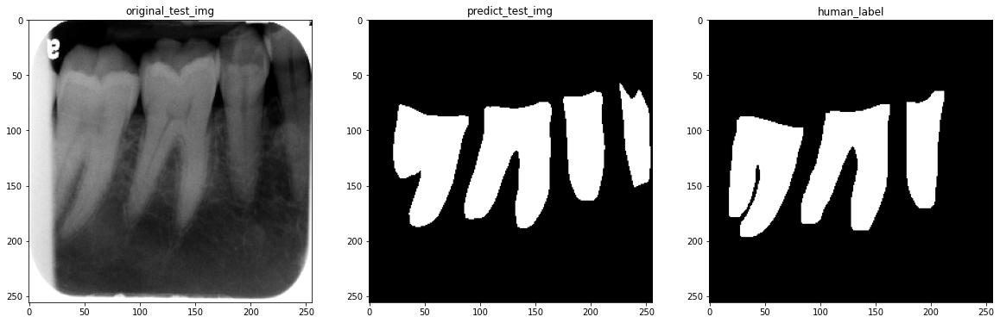


 16%|█▌        | 3/19 [00:01<00:06,  2.32it/s]

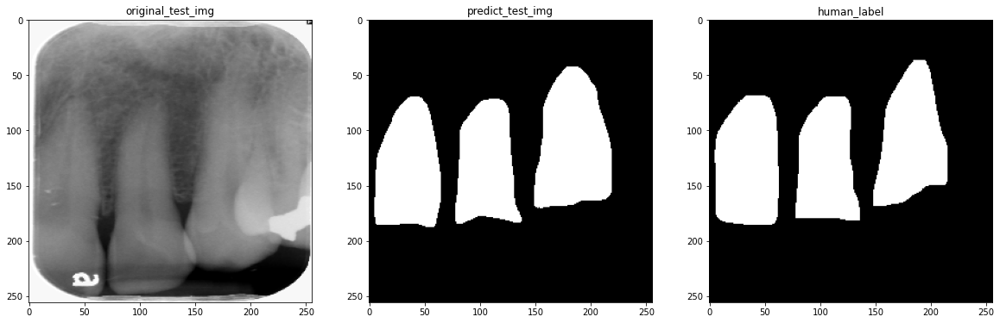


 21%|██        | 4/19 [00:01<00:06,  2.32it/s]

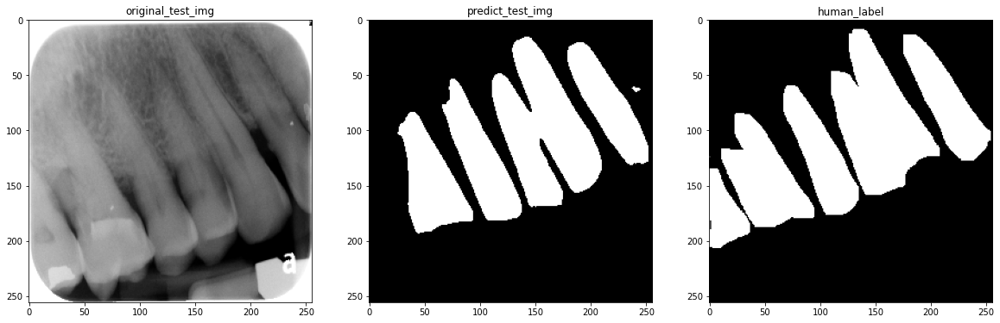


 26%|██▋       | 5/19 [00:02<00:06,  2.31it/s]

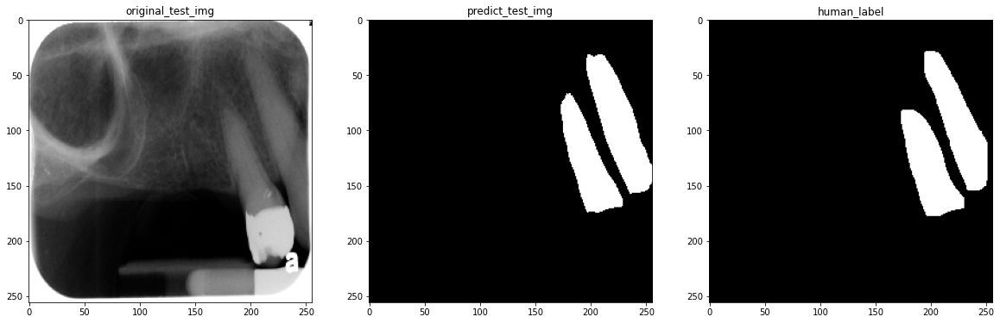


 32%|███▏      | 6/19 [00:02<00:05,  2.32it/s]

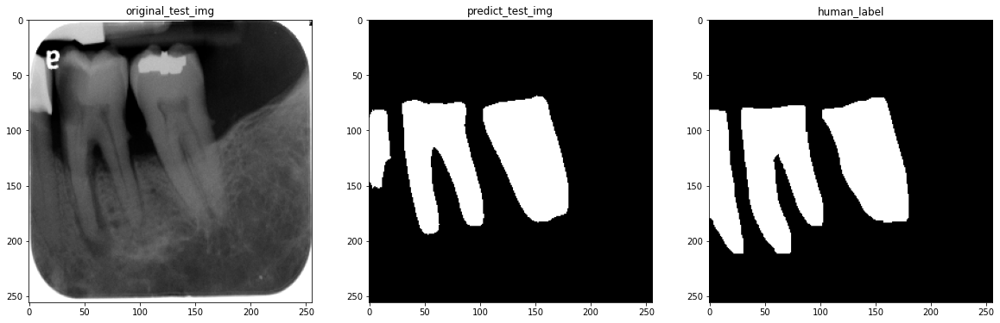


 37%|███▋      | 7/19 [00:03<00:05,  2.32it/s]

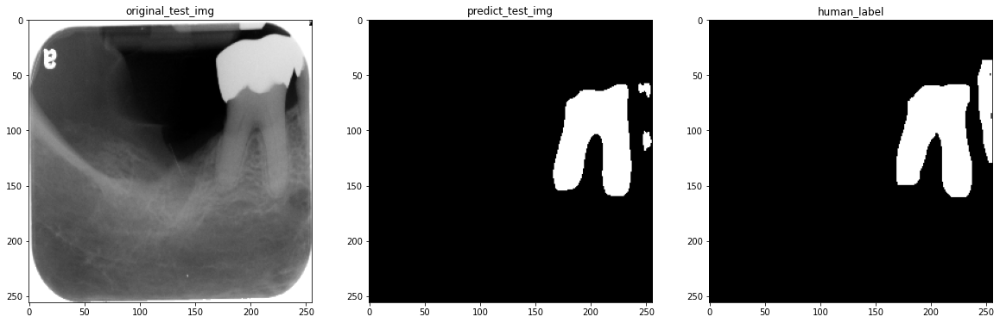


 42%|████▏     | 8/19 [00:03<00:04,  2.33it/s]

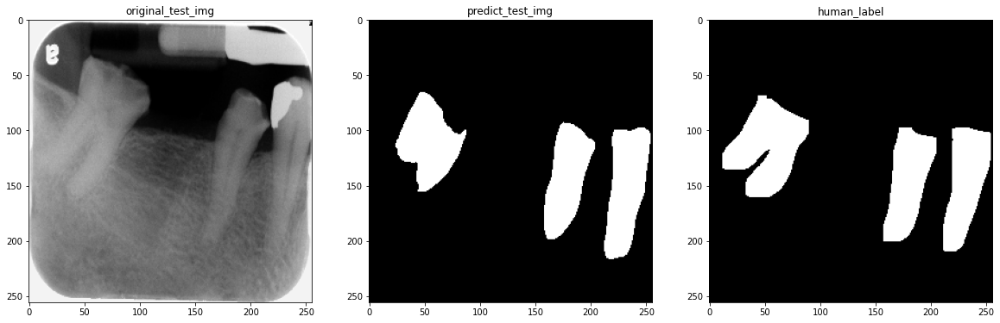


 47%|████▋     | 9/19 [00:03<00:04,  2.33it/s]

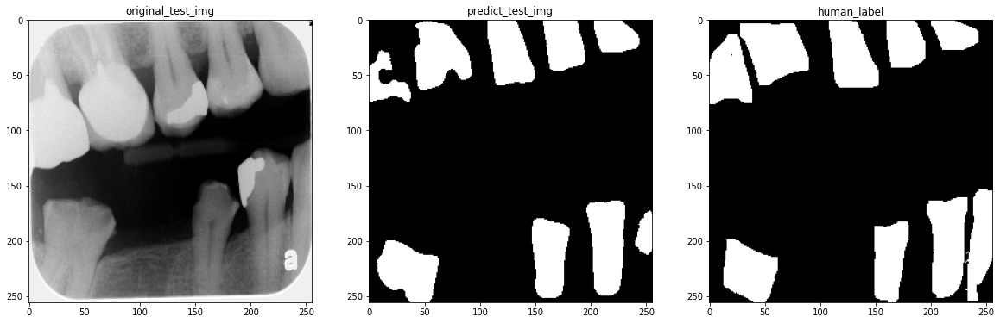


 53%|█████▎    | 10/19 [00:04<00:03,  2.32it/s]

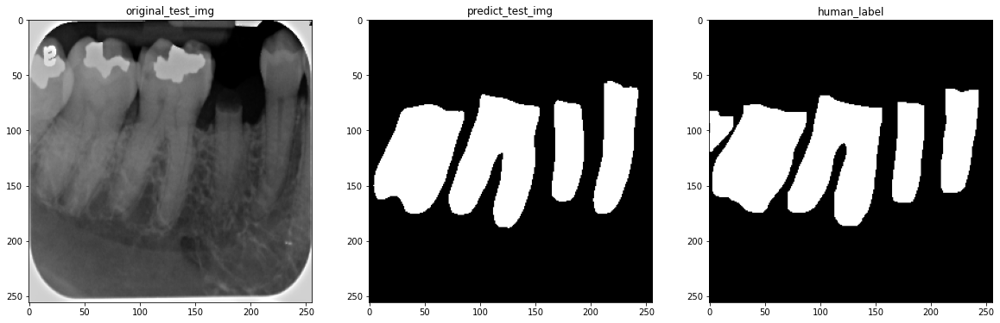


 58%|█████▊    | 11/19 [00:04<00:03,  2.32it/s]

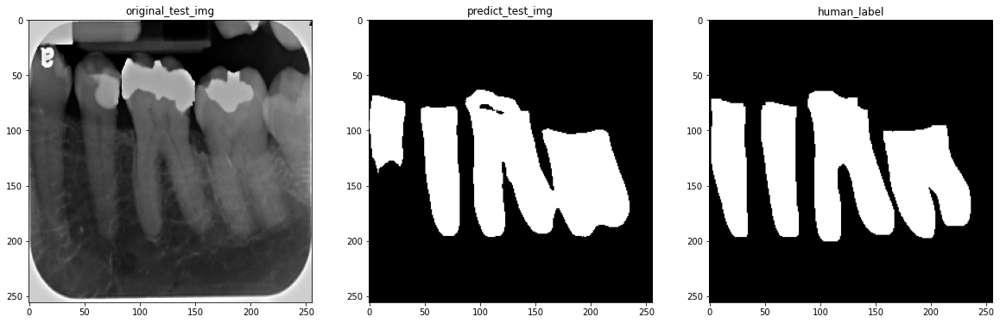


 63%|██████▎   | 12/19 [00:05<00:03,  2.32it/s]

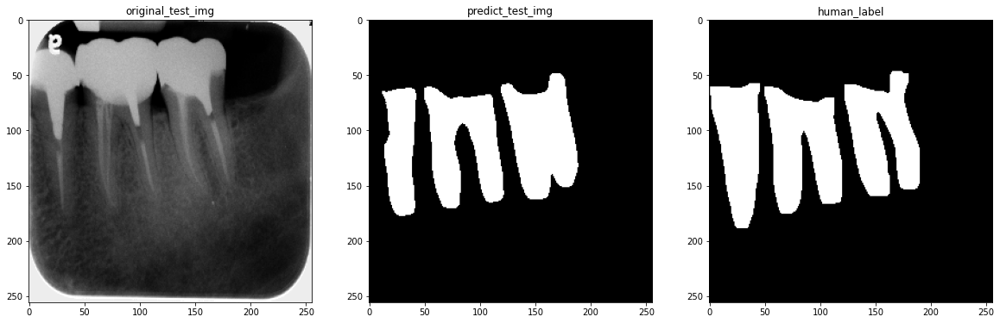


 68%|██████▊   | 13/19 [00:05<00:02,  2.32it/s]

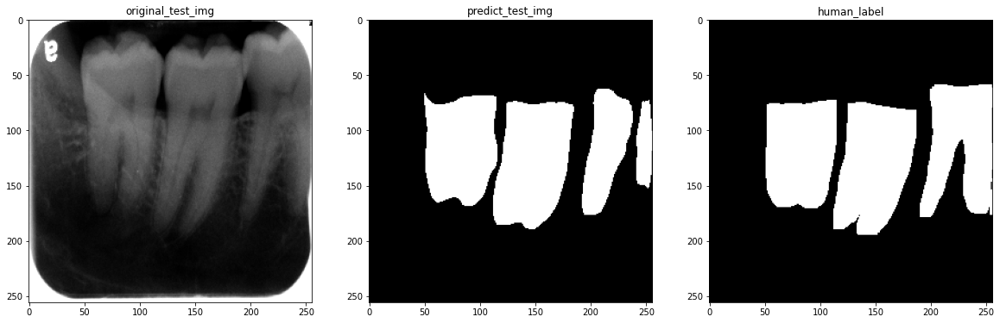


 74%|███████▎  | 14/19 [00:06<00:02,  2.32it/s]

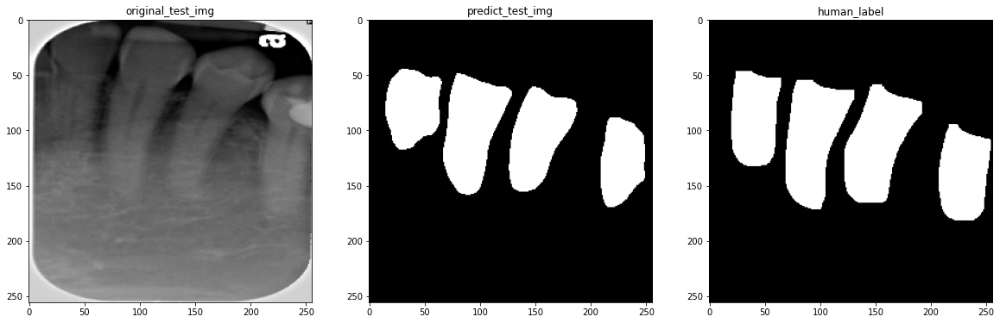


 79%|███████▉  | 15/19 [00:06<00:01,  2.32it/s]

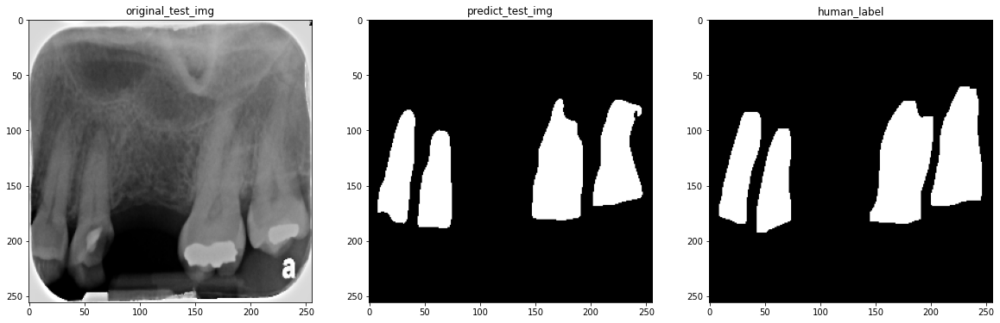


 84%|████████▍ | 16/19 [00:06<00:01,  2.32it/s]

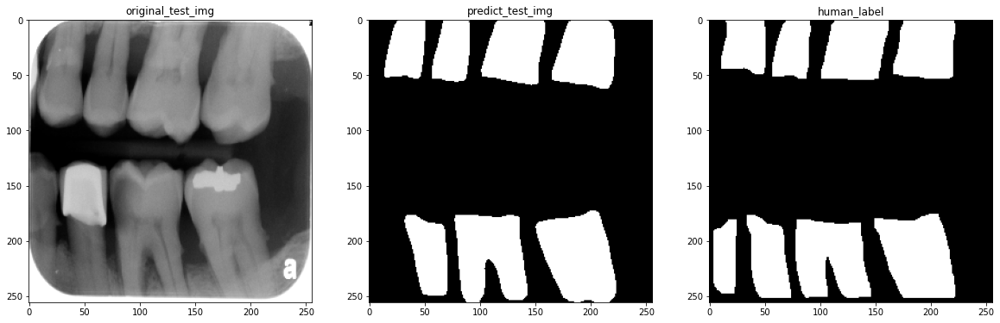


 89%|████████▉ | 17/19 [00:07<00:01,  1.70it/s]

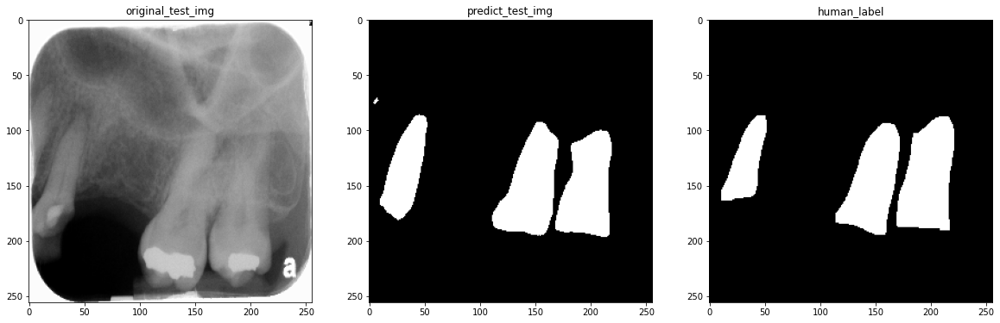


 95%|█████████▍| 18/19 [00:08<00:00,  1.85it/s]

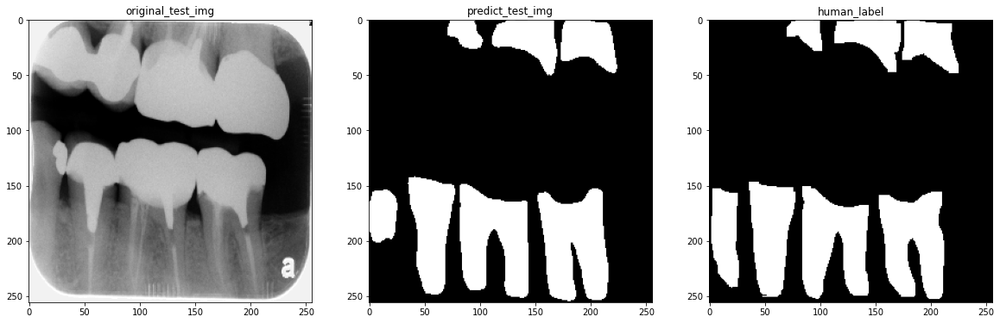


100%|██████████| 6/6 [00:50<00:00,  8.47s/it]


In [23]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
group_list = os.listdir(k_fold_folder_path)
group_list.sort()

for group_name in tqdm(group_list, total = len(group_list)):
    test_folder = os.path.join(k_fold_folder_path,group_name, 'skip_data', 'image')
    test_img_path_list = glob.glob(test_folder+'/*.PNG')
    show_k_fold_result(test_img_path_list)

In [24]:
k_fold_folder_path = os.path.join(k_fold_data_save_path, k_fold_folder_name)
group_list = os.listdir(k_fold_folder_path)
group_list.sort()

for group_name in tqdm(group_list, total = len(group_list)):
    test_folder = os.path.join(k_fold_folder_path, group_name, 'skip_data', 'image')
    result_folder = os.path.join(k_fold_folder_path, group_name, 'skip_data', 'prediction')
    model_save_total_path = model_save_path+model_save_name+'_{}'.format(group_name)+model_save_tpye
    test_k_group_in_skip_data(test_folder, result_folder, model_save_total_path)

100%|██████████| 6/6 [00:05<00:00,  1.14it/s]
